# V25 - GNN Supervised Trunk Edge Classifier (AMP Safe)

- GNN을 유지하되 최종 edge를 직접 회귀/유도하지 않고 trunk edge classifier로 학습합니다.
- GT node path를 GT edge mask로 변환하고 weighted BCE + Dice로 학습합니다.
- 시각화는 percentile이 아니라 fixed probability threshold를 사용합니다.
- 후처리 pruning은 GNN 출력 정리용입니다.

In [1]:
import os
!git -C swe3032 pull 2>/dev/null || git clone https://github.com/SKKUAIProjectTeam1/swe3032.git
os.chdir('swe3032')

Updating 3ddff95..7b5d6d7
Fast-forward
 train_v25_gnn_supervised_trunk_amp_safe.ipynb | 729 +++++++++-----------------
 1 file changed, 246 insertions(+), 483 deletions(-)


In [2]:
# ── OSM 도로 마스크 수집 (이미 있으면 자동 스킵) ──────────────────────────────
import os, glob
_road_dir = 'collegemap/road_masks'
_img_dir  = 'collegemap/images'
os.makedirs(_road_dir, exist_ok=True)

_existing = set(os.path.basename(p).replace('_road_mask.npy','') for p in glob.glob(f'{_road_dir}/*_road_mask.npy'))
_total    = len(glob.glob(f'{_img_dir}/*_building_mask.png'))
print(f'road_masks: {len(_existing)}/{_total}개 완료')

if len(_existing) < _total:
    print('  → 누락분 수집 시작 (osm_road_crawler.py)')
    !python collegemap/osm_road_crawler.py
else:
    print('  → 전부 완료, 스킵')


road_masks: 49/86개 완료
  → 누락분 수집 시작 (osm_road_crawler.py)
Traceback (most recent call last):
  File "/content/swe3032/collegemap/osm_road_crawler.py", line 15, in <module>
    import osmnx as ox
ModuleNotFoundError: No module named 'osmnx'


In [3]:
import glob, os
import numpy as np
import torch, torch.nn as nn, torch.nn.functional as F, torch.optim as optim
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
from PIL import Image
from scipy.ndimage import distance_transform_edt, maximum_filter, gaussian_filter
from scipy.sparse import csr_matrix
from scipy.sparse.csgraph import dijkstra as sp_dijkstra
import heapq

print(torch.cuda.get_device_name(0) if torch.cuda.is_available() else 'CPU')

Tesla T4


In [4]:
# ── 설정 ──────────────────────────────────────────────────────────────────────
CODE_VERSION  = 'v25_gnn_supervised_trunk_amp_safe'
print(f'코드 버전: {CODE_VERSION}')
RES           = 100
N             = RES * RES
NODE_DIM      = 7   # building, ridge, dist, x, y, cluster_node, dist_to_cluster
GAT_HEADS     = 4
EPOCHS        = 220
LR            = 4e-4
WARMUP_EPOCHS = 20
ATTN_DROPOUT  = 0.05
ACCUM_STEPS   = 10
N_GATES       = 2
GATE_MIN_DIST = 14
DEVICE        = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# V25 핵심 파라미터
CLUSTER_EPS       = 13.0
ROAD_CLEAR_MIN    = 3.0
ROAD_CLEAR_MAX    = 24.0
RIDGE_FILTER_SIZE = 7
EDGE_THR          = 0.50   # percentile 금지. edge classifier 확률 기준값
PRUNE_ITERS       = 12

IMG_DIR = 'collegemap/images'
TXT_DIR = 'collegemap/txt'
OUT_DIR = 'output'
CKPT    = os.path.join(OUT_DIR, 'v25_gnn_supervised_trunk.pth')
os.makedirs(OUT_DIR, exist_ok=True)


코드 버전: v25_gnn_supervised_trunk_amp_safe


In [5]:
# ── 고정 그래프 토폴로지 ───────────────────────────────────────────────────────
def _build_edges(res):
    edges = []
    for y in range(res):
        for x in range(res):
            s = y * res + x
            for dy in (-1, 0, 1):
                for dx in (-1, 0, 1):
                    if dy == 0 and dx == 0: continue
                    nx_, ny_ = x + dx, y + dy
                    if 0 <= nx_ < res and 0 <= ny_ < res:
                        edges.append((s, ny_ * res + nx_))
    edges += [(i, i) for i in range(res * res)]
    return torch.tensor(edges, dtype=torch.long).t().contiguous()

EDGE_INDEX = _build_edges(RES).to(DEVICE)

_bdy = []
for i in range(10, RES - 10):
    _bdy += [i, (RES-1)*RES + i, i*RES, i*RES + (RES-1)]
BOUNDARY   = sorted(set(_bdy))
BOUNDARY_T = torch.tensor(BOUNDARY, dtype=torch.long).to(DEVICE)

In [6]:
# ── 데이터 로딩 ────────────────────────────────────────────────────────────────
def _find_txt(img_path):
    stem   = os.path.basename(img_path).replace('_building_mask.png', '')
    direct = os.path.join(TXT_DIR, stem + '_building_places.txt')
    if os.path.exists(direct): return direct
    prefix = stem.replace('-', '_').split('_')[0]
    for fn in os.listdir(TXT_DIR):
        if fn.endswith('_building_places.txt') and fn.startswith(prefix):
            return os.path.join(TXT_DIR, fn)
    return None

def _nearest_road_node(cy, cx, is_bld_grid):
    non_bld_yx = np.argwhere(is_bld_grid == 0)
    if len(non_bld_yx) == 0: return int(cy) * RES + int(cx)
    dists = (non_bld_yx[:,0] - cy)**2 + (non_bld_yx[:,1] - cx)**2
    best  = non_bld_yx[np.argmin(dists)]
    return int(best[0]) * RES + int(best[1])

def _make_common_road_ridge(is_bld_grid):
    free = is_bld_grid == 0
    dist = distance_transform_edt(free)
    clear = (dist > ROAD_CLEAR_MIN) & (dist < ROAD_CLEAR_MAX)
    campus_influence = gaussian_filter(is_bld_grid.astype(np.float32), sigma=7.0)
    near_campus = campus_influence > 0.01
    local_max = dist == maximum_filter(dist, size=RIDGE_FILTER_SIZE)
    ridge = free & clear & near_campus & local_max
    ridge_score = gaussian_filter(ridge.astype(np.float32), sigma=1.2)
    if ridge_score.max() < 1e-6:
        band = free & clear & near_campus
        ridge_score = gaussian_filter(band.astype(np.float32), sigma=1.0)
    ridge_score = ridge_score / (ridge_score.max() + 1e-6)
    return ridge_score.astype(np.float32), dist.astype(np.float32)

def _cluster_centers(centers, eps=CLUSTER_EPS):
    n = len(centers); visited = [False] * n; clusters = []
    for i in range(n):
        if visited[i]: continue
        stack = [i]; visited[i] = True; cluster = []
        while stack:
            u = stack.pop(); cluster.append(u); uy, ux = centers[u]
            for v in range(n):
                if visited[v]: continue
                vy, vx = centers[v]
                if ((uy - vy) ** 2 + (ux - vx) ** 2) ** 0.5 <= eps:
                    visited[v] = True; stack.append(v)
        clusters.append(cluster)
    return clusters

def _nearest_ridge_node(cy, cx, is_bld_grid, ridge_grid):
    candidates = np.argwhere((is_bld_grid == 0) & (ridge_grid > 0.05))
    if len(candidates) == 0:
        return _nearest_road_node(cy, cx, is_bld_grid)
    dists = (candidates[:,0] - cy)**2 + (candidates[:,1] - cx)**2
    best = candidates[np.argmin(dists)]
    return int(best[0]) * RES + int(best[1])

def _make_move_graph(is_bld_grid, ridge_grid):
    cost = (1.0 / (ridge_grid.flatten() + 0.12)).astype(np.float32)
    cost[is_bld_grid.flatten() > 0] = 1e6
    y_c = np.repeat(np.arange(RES), RES)
    x_c = np.tile(np.arange(RES), RES)
    rows, cols, vals = [], [], []
    for dy in (-1, 0, 1):
        for dx in (-1, 0, 1):
            if dy == 0 and dx == 0: continue
            ny, nx = y_c + dy, x_c + dx
            valid = (ny >= 0) & (ny < RES) & (nx >= 0) & (nx < RES)
            u = y_c[valid] * RES + x_c[valid]
            v = ny[valid] * RES + nx[valid]
            w = cost[v] * (1.4142 if abs(dy) + abs(dx) == 2 else 1.0)
            rows.append(u); cols.append(v); vals.append(w)
    return csr_matrix((np.concatenate(vals), (np.concatenate(rows), np.concatenate(cols))), shape=(N, N))

def _select_gate_nodes(cluster_node_list, is_bld_grid, ridge_grid):
    """GT에 외부 진입점이 들어가도록 boundary 중 클러스터와 가까운 비건물 노드를 고릅니다."""
    if len(cluster_node_list) == 0: return []
    cy = np.mean([n // RES for n in cluster_node_list])
    cx = np.mean([n % RES for n in cluster_node_list])
    candidates = []
    for node in BOUNDARY:
        y, x = divmod(int(node), RES)
        if is_bld_grid[y, x] > 0: continue
        # 외곽 중 캠퍼스 중심과 가까운 후보. ridge가 있으면 가산점.
        score = ((y - cy) ** 2 + (x - cx) ** 2) ** 0.5 - ridge_grid[y, x] * 8.0
        candidates.append((score, int(node)))
    candidates.sort(key=lambda t: t[0])
    chosen = []
    for _, node in candidates:
        y, x = divmod(node, RES)
        if all(abs(x - (p % RES)) + abs(y - (p // RES)) >= GATE_MIN_DIST for p in chosen):
            chosen.append(node)
        if len(chosen) == N_GATES: break
    return chosen

def _compute_gt_path_nodes(terminals, is_bld_grid, ridge_grid):
    """터미널들을 MST로 묶은 trunk GT node mask를 만듭니다."""
    n_t = len(terminals)
    if n_t <= 1 or n_t > 14:
        return torch.zeros(N, dtype=torch.bool, device=DEVICE)
    graph = _make_move_graph(is_bld_grid, ridge_grid)
    idx = np.array(terminals, dtype=np.int32)
    dist, prev = sp_dijkstra(graph, directed=True, indices=idx, return_predecessors=True)

    in_mst = [False] * n_t; in_mst[0] = True; mst_edges = []
    for _ in range(n_t - 1):
        bc, bi, bj = np.inf, -1, -1
        for i in range(n_t):
            if not in_mst[i]: continue
            for j in range(n_t):
                if in_mst[j]: continue
                d = dist[i, terminals[j]]
                if d < bc:
                    bc, bi, bj = d, i, j
        if bi == -1 or not np.isfinite(bc): break
        in_mst[bj] = True; mst_edges.append((bi, bj))

    path_nodes = set()
    for i, j in mst_edges:
        cur = terminals[j]; src = terminals[i]; guard = 0
        while cur != src and cur >= 0 and guard < N:
            path_nodes.add(cur)
            cur = int(prev[i, cur])
            guard += 1
        path_nodes.add(src)
    gt_mask = torch.zeros(N, dtype=torch.bool, device=DEVICE)
    if path_nodes:
        gt_mask[torch.tensor(list(path_nodes), dtype=torch.long, device=DEVICE)] = True
    return gt_mask


def _make_graph_from_cost(cost_flat):
    y_c = np.repeat(np.arange(RES), RES); x_c = np.tile(np.arange(RES), RES)
    rows, cols, vals = [], [], []
    for dy in (-1, 0, 1):
        for dx in (-1, 0, 1):
            if dy == 0 and dx == 0: continue
            ny, nx = y_c + dy, x_c + dx
            valid = (ny >= 0) & (ny < RES) & (nx >= 0) & (nx < RES)
            u = y_c[valid] * RES + x_c[valid]
            v = ny[valid] * RES + nx[valid]
            w = cost_flat[v] * (1.4142 if abs(dy) + abs(dx) == 2 else 1.0)
            rows.append(u); cols.append(v); vals.append(w)
    return csr_matrix((np.concatenate(vals), (np.concatenate(rows), np.concatenate(cols))), shape=(N, N))

def _dijkstra_mst_nodes(terminals, graph):
    n_t = len(terminals)
    if n_t <= 1 or n_t > 14: return set()
    idx = np.array(terminals, dtype=np.int32)
    dist, prev = sp_dijkstra(graph, directed=True, indices=idx, return_predecessors=True)
    in_mst = [False]*n_t; in_mst[0] = True; mst_edges = []
    for _ in range(n_t - 1):
        bc, bi, bj = np.inf, -1, -1
        for i in range(n_t):
            if not in_mst[i]: continue
            for j in range(n_t):
                if in_mst[j]: continue
                d = dist[i, terminals[j]]
                if d < bc: bc, bi, bj = d, i, j
        if bi == -1 or not np.isfinite(bc): break
        in_mst[bj] = True; mst_edges.append((bi, bj))
    nodes = set()
    for i, j in mst_edges:
        cur = terminals[j]; s = terminals[i]; g = 0
        while cur != s and cur >= 0 and g < N:
            nodes.add(cur); cur = int(prev[i, cur]); g += 1
        nodes.add(s)
    return nodes

def _astar_path(src_n, dst_n, cost_flat, is_bld_flat):
    gy, gx = divmod(dst_n, RES)
    g_score = {src_n: 0.}; came = {}
    h = lambda n: ((n//RES-gy)**2 + (n%RES-gx)**2)**0.5
    open_set = [(h(src_n), 0., src_n)]
    while open_set:
        _, gs, cur = heapq.heappop(open_set)
        if cur == dst_n: break
        if gs > g_score.get(cur, np.inf): continue
        cy, cx = divmod(cur, RES)
        for dy in (-1, 0, 1):
            for dx in (-1, 0, 1):
                if dy == dx == 0: continue
                ny, nx = cy+dy, cx+dx
                if not (0<=ny<RES and 0<=nx<RES): continue
                nb = ny*RES+nx
                if is_bld_flat[nb] > 0: continue
                step = cost_flat[nb]*(1.4142 if abs(dy)+abs(dx)==2 else 1.)
                ng = gs+step
                if ng < g_score.get(nb, np.inf):
                    g_score[nb] = ng; came[nb] = cur
                    heapq.heappush(open_set, (ng+h(nb), ng, nb))
    path = set(); cur = dst_n
    while cur in came: path.add(cur); cur = came[cur]
    path.add(src_n)
    return path

def _astar_mst_nodes(terminals, cost_flat, is_bld_flat):
    if len(terminals) <= 1: return set(terminals)
    in_mst = [False]*len(terminals); in_mst[0] = True
    connected = {terminals[0]}; nodes = {terminals[0]}
    for _ in range(len(terminals)-1):
        best_path = None; best_cost = np.inf
        for j, t in enumerate(terminals):
            if in_mst[j]: continue
            for s in connected:
                p = _astar_path(s, t, cost_flat, is_bld_flat)
                c = sum(cost_flat[n] for n in p)
                if c < best_cost: best_cost = c; best_path = (p, j, t)
        if best_path is None: break
        p, j, t = best_path; nodes |= p; in_mst[j] = True; connected.add(t)
    return nodes

def _compute_consensus_gt(terminals, is_bld, ridge, road_map=None):
    """OSM 도로 위에서 여러 알고리즘 실행 → consensus 구간이 GT.
    OSM 없으면 ridge 위에서 Dijkstra+A* fallback."""
    if len(terminals) <= 1:
        return torch.zeros(N, dtype=torch.bool, device=DEVICE), 'empty'
    is_bld_flat = is_bld.flatten()
    if road_map is not None and (road_map > 0.4).sum() > 10:
        road_flat = road_map.flatten()
        # 도로 위 저비용, 비도로 고비용 → 알고리즘이 OSM 도로를 따라 이동
        c1 = np.where(road_flat>0.4, 1./(road_flat+0.1), 50.).astype(np.float32)
        c1[is_bld_flat > 0] = 1e6
        c2 = np.where(road_flat>0.4, 1./(road_flat**2+0.01), 50.).astype(np.float32)
        c2[is_bld_flat > 0] = 1e6
        p1 = _dijkstra_mst_nodes(terminals, _make_graph_from_cost(c1))  # 높은 tier 선호
        p2 = _astar_mst_nodes(terminals, c1, is_bld_flat)               # 직선 편향
        p3 = _dijkstra_mst_nodes(terminals, _make_graph_from_cost(c2))  # tier 강하게 선호
        paths = [p1, p2, p3]; src_label = 'consensus_osm'
    else:
        cost_r = (1.0/(ridge.flatten()+0.12)).astype(np.float32)
        cost_r[is_bld_flat > 0] = 1e6
        p1 = _dijkstra_mst_nodes(terminals, _make_move_graph(is_bld, ridge))
        p2 = _astar_mst_nodes(terminals, cost_r, is_bld_flat)
        paths = [p1, p2]; src_label = 'consensus_ridge'
    votes = np.zeros(N, dtype=np.int32)
    for p in paths:
        for n in p: votes[n] += 1
    consensus = {int(n) for n in np.where(votes >= 2)[0] if is_bld_flat[n] == 0}
    gt_mask = torch.zeros(N, dtype=torch.bool, device=DEVICE)
    if consensus:
        gt_mask[torch.tensor(list(consensus), dtype=torch.long, device=DEVICE)] = True
    return gt_mask, src_label

def _make_gt_edge_mask(gt_nodes_mask, bld_mask):
    src, dst = EDGE_INDEX[0], EDGE_INDEX[1]
    non_self = src != dst
    # 둘 다 GT path 위에 있는 edge만 positive. OR로 하면 path 주변 찌꺼기까지 positive가 됨.
    gt_edge = (gt_nodes_mask[src] & gt_nodes_mask[dst] & non_self & (~bld_mask))
    return gt_edge.float()

def _dist_to_nodes_feature(nodes):
    yy = torch.arange(N, device=DEVICE) // RES
    xx = torch.arange(N, device=DEVICE) % RES
    if len(nodes) == 0:
        return torch.ones(N, device=DEVICE)
    feats = []
    for node in nodes:
        y, x = divmod(int(node), RES)
        d = torch.sqrt((yy.float() - y) ** 2 + (xx.float() - x) ** 2)
        feats.append(d)
    dmin = torch.stack(feats, dim=0).min(dim=0).values
    return torch.exp(-dmin / 12.0)


def _generate_gt_variants(terminals, is_bld, ridge, road_map, bld_mask):
    """알고리즘마다 다른 GT edge mask 생성 → 데이터 증강.
    OSM 있으면 4종, 없으면 2종(ridge 기반)."""
    if len(terminals) <= 1:
        empty = torch.zeros(EDGE_INDEX.shape[1], dtype=torch.float32, device=DEVICE)
        return [empty]

    is_bld_flat = is_bld.flatten()
    variants = []

    if road_map is not None and (road_map > 0.4).sum() > 10:
        road_flat = road_map.flatten()
        # 1) Dijkstra: tier 선호 (cost = 1/(val+0.1))
        c1 = np.where(road_flat>0.4, 1./(road_flat+0.1), 50.).astype(np.float32)
        c1[is_bld_flat>0] = 1e6
        # 2) Dijkstra: uniform (도로면 동등, cost=1)
        c2 = np.where(road_flat>0.4, 1., 50.).astype(np.float32)
        c2[is_bld_flat>0] = 1e6
        # 3) Dijkstra: tier 제곱 (높은 도로만 강하게 선호)
        c3 = np.where(road_flat>0.4, 1./(road_flat**2+0.01), 50.).astype(np.float32)
        c3[is_bld_flat>0] = 1e6
        for cost in [c1, c2, c3]:
            nodes = _dijkstra_mst_nodes(terminals, _make_graph_from_cost(cost))
            m = torch.zeros(N, dtype=torch.bool, device=DEVICE)
            if nodes: m[torch.tensor(list(nodes), dtype=torch.long, device=DEVICE)] = True
            variants.append(_make_gt_edge_mask(m, bld_mask))
        # 4) A*: 직선 편향 (c1 cost + 유클리드 휴리스틱)
        nodes_a = _astar_mst_nodes(terminals, c1, is_bld_flat)
        m = torch.zeros(N, dtype=torch.bool, device=DEVICE)
        if nodes_a: m[torch.tensor(list(nodes_a), dtype=torch.long, device=DEVICE)] = True
        variants.append(_make_gt_edge_mask(m, bld_mask))
    else:
        # OSM 없음: ridge 기반 Dijkstra + A*
        cost_r = (1.0/(ridge.flatten()+0.12)).astype(np.float32)
        cost_r[is_bld_flat>0] = 1e6
        nodes1 = _dijkstra_mst_nodes(terminals, _make_move_graph(is_bld, ridge))
        nodes2 = _astar_mst_nodes(terminals, cost_r, is_bld_flat)
        for nodes in [nodes1, nodes2]:
            m = torch.zeros(N, dtype=torch.bool, device=DEVICE)
            if nodes: m[torch.tensor(list(nodes), dtype=torch.long, device=DEVICE)] = True
            variants.append(_make_gt_edge_mask(m, bld_mask))

    return variants

def load_campus(img_path, txt_path):
    img    = Image.open(img_path).convert('L')
    W, H   = img.size
    is_bld = (np.array(img.resize((RES,RES), resample=Image.NEAREST)) > 128).astype(np.float32)

    ridge, dist = _make_common_road_ridge(is_bld)
    dist_n = (dist / (dist.max() + 1e-6)).astype(np.float32)

    ns = {}
    exec(open(txt_path, encoding='utf-8').read(), ns)
    poly = ns['BUILDING_POLY']

    building_ids = list(poly.keys())
    centers = []
    for bid in building_ids:
        pts = poly[bid]
        cy = np.mean([p[1] for p in pts]) * RES / H
        cx = np.mean([p[0] for p in pts]) * RES / W
        centers.append((cy, cx))

    bld_nodes = [_nearest_road_node(cy, cx, is_bld) for cy, cx in centers]
    clusters = _cluster_centers(centers, eps=CLUSTER_EPS)
    cluster_nodes, cluster_groups = [], []
    for cluster in clusters:
        cy = np.mean([centers[i][0] for i in cluster])
        cx = np.mean([centers[i][1] for i in cluster])
        node = _nearest_ridge_node(cy, cx, is_bld, ridge)
        if node not in cluster_nodes:
            cluster_nodes.append(node)
            cluster_groups.append([building_ids[i] for i in cluster])
    if len(cluster_nodes) <= 1 and len(bld_nodes) > 1:
        cluster_nodes = list(dict.fromkeys(bld_nodes))
        cluster_groups = [[bid] for bid in building_ids]

    gate_nodes = _select_gate_nodes(cluster_nodes, is_bld, ridge)
    terminals = list(dict.fromkeys(gate_nodes + cluster_nodes))

    ib_flat  = torch.tensor(is_bld.flatten(), dtype=torch.float32).to(DEVICE)
    src, dst = EDGE_INDEX[0], EDGE_INDEX[1]
    bld_mask = (ib_flat[src] > 0) | (ib_flat[dst] > 0)

    # GT 변형 생성 (알고리즘별 별도 GT → 데이터 증강)
    slug = os.path.basename(img_path).replace('_building_mask.png', '')
    road_npy = os.path.join('collegemap', 'road_masks', f'{slug}_road_mask.npy')
    road_map = np.load(road_npy) if os.path.exists(road_npy) else None
    gt_source = 'osm' if road_map is not None else 'ridge'
    gt_variants = _generate_gt_variants(terminals, is_bld, ridge, road_map, bld_mask)
    gt_edge_mask = gt_variants[0]  # 기본값 (시각화/val용)

    xs = np.tile(np.arange(RES), RES).astype(np.float32) / RES
    ys = np.repeat(np.arange(RES), RES).astype(np.float32) / RES
    cluster_indicator = torch.zeros(N, device=DEVICE)
    if cluster_nodes:
        cluster_indicator[torch.tensor(cluster_nodes, dtype=torch.long, device=DEVICE)] = 1.0
    dist_to_cluster = _dist_to_nodes_feature(cluster_nodes).detach().cpu().numpy().astype(np.float32)

    node_feats = np.stack([
        is_bld.flatten(),
        ridge.flatten(),
        dist_n.flatten(),
        xs,
        ys,
        cluster_indicator.detach().cpu().numpy().astype(np.float32),
        dist_to_cluster,
    ], axis=1)

    return {
        'node_feats':     torch.tensor(node_feats, dtype=torch.float32).to(DEVICE),
        'is_building':    ib_flat,
        'bld_mask':       bld_mask,
        'ridge':          torch.tensor(ridge.flatten(), dtype=torch.float32).to(DEVICE),
        'building_nodes': torch.tensor(bld_nodes, dtype=torch.long).to(DEVICE),
        'cluster_nodes':  torch.tensor(cluster_nodes, dtype=torch.long).to(DEVICE),
        'gate_nodes':     torch.tensor(gate_nodes, dtype=torch.long).to(DEVICE),
        'terminal_nodes': torch.tensor(terminals, dtype=torch.long).to(DEVICE),
        'cluster_groups': cluster_groups,
        'gt_variants':    gt_variants,
        'gt_edge_mask':   gt_edge_mask,
        'poly': poly,
        'name': os.path.basename(img_path).replace('_building_mask.png',''),
        'gt_source': gt_source,
        'W': W,
        'H': H,
    }

campuses = []
for img_path in sorted(glob.glob(os.path.join(IMG_DIR, '*_building_mask.png'))):
    txt = _find_txt(img_path)
    if txt:
        try:
            campuses.append(load_campus(img_path, txt))
        except Exception as e:
            print(f'skip {os.path.basename(img_path)}: {e}')
print(f'{len(campuses)}개 캠퍼스 로드 완료')
for c in campuses[:3]:
    n_ge = int(c['gt_edge_mask'].sum())
    print(f"{c['name']} [{c['gt_source']}]: clusters={len(c['cluster_nodes'])}, gt_edges={n_ge}")
import random
osm_campuses  = [c for c in campuses if c['gt_source'] == 'osm']
test_campuses = [c for c in campuses if c['gt_source'] == 'dijkstra']

random.seed(42)
random.shuffle(osm_campuses)
n_val = max(1, len(osm_campuses) // 7)  # ~14% val
val_campuses   = osm_campuses[:n_val]
train_campuses = osm_campuses[n_val:]

# test셋: gt_hint(feature 7)와 gt mask 제거 — 모델이 GT를 받으면 안 됨
for c in test_campuses:
    c['gt_edge_mask'] = torch.zeros_like(c['gt_edge_mask'])
    c['gt_nodes_mask'] = torch.zeros_like(c['gt_nodes_mask'])

print(f'Train: {len(train_campuses)}  Val: {len(val_campuses)}  Test: {len(test_campuses)} (GT 없음)')


86개 캠퍼스 로드 완료
aalto_university [osm]: clusters=3, gt_edges=142
ajou_university [osm]: clusters=3, gt_edges=0
carnegie_mellon_university [osm]: clusters=3, gt_edges=202
Train: 42  Val: 7  Test: 37 (GT 없음)


In [7]:
# ── 모델: GNN trunk edge classifier ────────────────────────────────────────────
class MHGATLayer(nn.Module):
    def __init__(self, in_dim, out_dim, heads=4, dropout=0.0):
        super().__init__()
        assert out_dim % heads == 0
        self.heads = heads; self.dh = out_dim // heads
        self.W    = nn.Linear(in_dim, out_dim, bias=False)
        self.a_s  = nn.Parameter(torch.empty(heads, self.dh))
        self.a_d  = nn.Parameter(torch.empty(heads, self.dh))
        self.norm = nn.LayerNorm(out_dim)
        self.skip = nn.Linear(in_dim, out_dim, bias=False) if in_dim != out_dim else nn.Identity()
        self.drop = nn.Dropout(dropout)
        nn.init.xavier_uniform_(self.W.weight, gain=1.414)
        nn.init.xavier_normal_(self.a_s.unsqueeze(0)); nn.init.xavier_normal_(self.a_d.unsqueeze(0))

    def forward(self, x, ei):
        n = x.size(0); src, dst = ei[0], ei[1]
        h = self.W(x).view(n, self.heads, self.dh)
        e = F.leaky_relu((h[src]*self.a_s).sum(-1) + (h[dst]*self.a_d).sum(-1), 0.2)
        e_exp = torch.exp(e - e.max())
        denom = torch.zeros(n, self.heads, device=x.device)
        denom.scatter_add_(0, src.unsqueeze(1).expand(-1, self.heads), e_exp)
        alpha = self.drop(e_exp / (denom[src] + 1e-8))
        msg   = alpha.unsqueeze(-1) * h[dst]
        agg   = torch.zeros(n, self.heads, self.dh, device=x.device)
        agg.scatter_add_(0, src[:,None,None].expand_as(msg), msg)
        return self.norm(F.elu(agg.view(n,-1)) + self.skip(x))

class CampusGAT(nn.Module):
    def __init__(self):
        super().__init__()
        self.gat1 = MHGATLayer(NODE_DIM, 64, GAT_HEADS, ATTN_DROPOUT)
        self.gat2 = MHGATLayer(64, 64, GAT_HEADS, ATTN_DROPOUT)
        self.gat3 = MHGATLayer(64, 64, GAT_HEADS, ATTN_DROPOUT)
        # edge classifier: h_s, h_d, |h_s-h_d|, h_s*h_d, raw edge feature 3개
        self.edge_head = nn.Sequential(
            nn.Linear(64*4 + 2, 128), nn.ReLU(), nn.Dropout(0.08),
            nn.Linear(128, 32), nn.ReLU(),
            nn.Linear(32, 1)
        )
        self.gate_head = nn.Linear(64, 1)
        for m in self.modules():
            if isinstance(m, nn.Linear) and m.bias is not None:
                nn.init.zeros_(m.bias)
        nn.init.constant_(self.edge_head[-1].bias, -3.0)
        nn.init.constant_(self.gate_head.bias, -5.0)

    def forward(self, feats, ei, bld_mask):
        h1 = self.gat1(feats, ei)
        h2 = self.gat2(h1, ei)
        h3 = self.gat3(h2, ei)
        src, dst = ei[0], ei[1]
        hs, hd = h3[src], h3[dst]
        raw_edge = torch.stack([
            (feats[src, 1] + feats[dst, 1]) * 0.5,  # ridge score
            (src != dst).float(),                  # self-loop 구분
        ], dim=1)
        edge_feat = torch.cat([hs, hd, torch.abs(hs-hd), hs*hd, raw_edge], dim=1)
        edge_logits = self.edge_head(edge_feat).squeeze(-1)
        # 건물 통과 edge와 self-loop는 최종 도로 후보에서 제거
        valid = (~bld_mask) & (src != dst)
        ew = torch.sigmoid(edge_logits) * valid.float()
        gs = torch.sigmoid(self.gate_head(h3[BOUNDARY_T]).squeeze(-1))
        # ew: 후처리/시각화/regularization용 확률값
        # edge_logits: AMP-safe BCEWithLogitsLoss 학습용 원본 logit
        return ew, edge_logits, gs

model = CampusGAT().to(DEVICE)
print(f'파라미터: {sum(p.numel() for p in model.parameters()):,}개')


파라미터: 47,490개


In [ ]:
# ── 손실 함수: GT trunk edge supervised BCE ───────────────────────────────────
def trunk_bce_loss(edge_logits, gt_edge_mask, valid_mask):
    """edge 단위 trunk classifier loss.
    AMP/autocast 환경에서는 sigmoid 후 BCELoss가 unsafe라서
    원본 logit에 BCEWithLogits를 직접 적용합니다.
    """
    valid = valid_mask.bool()
    if valid.sum() == 0 or gt_edge_mask.sum() == 0:
        return edge_logits.sum() * 0.

    logits = torch.nan_to_num(edge_logits[valid].float(), nan=0., posinf=20., neginf=-20.).clamp(-20., 20.)
    target = gt_edge_mask[valid].float()

    pos = target.sum()
    neg = target.numel() - pos
    pos_weight = torch.clamp(neg / (pos + 1e-6), min=1.0, max=80.0).detach()

    return F.binary_cross_entropy_with_logits(logits, target, pos_weight=pos_weight)

def soft_dice_loss(ew, gt_edge_mask, valid_mask):
    valid = valid_mask.bool()
    pred = ew[valid]
    target = gt_edge_mask[valid].float()
    inter = (pred * target).sum()
    return 1.0 - (2.0 * inter + 1.0) / (pred.sum() + target.sum() + 1.0)

def false_positive_ridge_loss(ew, c):
    """GT가 아닌데 건물 외곽이나 낮은 ridge에 붙는 edge를 억제합니다."""
    src, dst = EDGE_INDEX[0], EDGE_INDEX[1]
    valid = ((src != dst) & (~c['bld_mask'])).bool()
    gt = c['gt_edge_mask'].bool()
    rs = (c['ridge'][src] + c['ridge'][dst]) * 0.5
    fp = valid & (~gt)
    if fp.sum() == 0:
        return ew.sum() * 0.
    # ridge가 낮은 곳의 false positive를 더 강하게 벌점
    return (ew[fp] * (1.0 - rs[fp]).clamp(0.2, 1.0)).mean()

def gate_count_loss(gs):
    return (gs.sum() - N_GATES).pow(2) * 0.2 + (gs * (1.0 - gs)).mean() * 0.02

def loss_terms(ew, edge_logits, gs, c, scale):
    src, dst = EDGE_INDEX[0], EDGE_INDEX[1]
    valid = ((src != dst) & (~c['bld_mask'])).bool()
    bce  = trunk_bce_loss(edge_logits, c['gt_edge_mask'], valid)
    dice = soft_dice_loss(ew, c['gt_edge_mask'], valid)
    fp   = false_positive_ridge_loss(ew, c) * (0.2 + 0.8 * scale)
    sparse = ew[valid].mean() * 0.03
    gate = gate_count_loss(gs)

    with torch.no_grad():
        pred = ew[valid] > EDGE_THR
        gt = c['gt_edge_mask'][valid] > 0
        tp = (pred & gt).sum().float()
        precision = tp / (pred.sum().float() + 1e-6)
        recall = tp / (gt.sum().float() + 1e-6)

    return {
        'bce': bce,
        'dice': dice,
        'fp': fp,
        'sparse': sparse,
        'gate': gate,
        'precision': precision.detach(),
        'recall': recall.detach(),
    }

def loss_fn(ew, edge_logits, gs, c, scale):
    terms = loss_terms(ew, edge_logits, gs, c, scale)
    return terms['bce'] + 0.8 * terms['dice'] + terms['fp'] + terms['sparse'] + terms['gate']


In [9]:
# ── 학습 ──────────────────────────────────────────────────────────────────────
opt    = optim.AdamW(model.parameters(), lr=LR, weight_decay=1e-4)
sch    = optim.lr_scheduler.CosineAnnealingLR(opt, T_max=EPOCHS, eta_min=5e-6)
scaler = torch.cuda.amp.GradScaler(enabled=torch.cuda.is_available())
n = len(train_campuses); loss_curve = []; val_curve = []

for ep in range(1, EPOCHS+1):
    model.train(); scale = min(1.0, ep/WARMUP_EPOCHS); total = 0.; opt.zero_grad()
    debug_terms = None

    do_debug = (ep % 10 == 0 or ep == 1)
    acc_terms = None

    n_var = max(1, len(train_campuses[0]['gt_variants']))
    for i, c in enumerate(train_campuses):
        for gt_mask in c['gt_variants']:
            c_aug = dict(c); c_aug['gt_edge_mask'] = gt_mask
            with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
                ew, edge_logits, gs = model(c_aug['node_feats'], EDGE_INDEX, c_aug['bld_mask'])
                loss = loss_fn(ew, edge_logits, gs, c_aug, scale) / (n * n_var)
            if not torch.isfinite(loss):
                print(f'non-finite loss at ep={ep}, campus={c["name"]}, skip'); loss = loss * 0.
            scaler.scale(loss).backward(); total += loss.item() * n * n_var

        if do_debug:
            with torch.no_grad():
                terms = {k: float(v.detach().cpu()) for k, v in loss_terms(ew, edge_logits, gs, c, scale).items()}
                if acc_terms is None:
                    acc_terms = terms.copy()
                else:
                    for k in terms: acc_terms[k] += terms[k]

        if (i+1) % ACCUM_STEPS == 0 or (i+1) == n:
            scaler.unscale_(opt)
            torch.nn.utils.clip_grad_norm_(model.parameters(), 2.0)
            scaler.step(opt); scaler.update(); opt.zero_grad()
            if torch.cuda.is_available(): torch.cuda.empty_cache()

    sch.step(); loss_curve.append(total/n)

    # val
    model.eval()
    with torch.no_grad():
        val_total = 0.
        for c in val_campuses:
            with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
                ew, edge_logits, gs = model(c['node_feats'], EDGE_INDEX, c['bld_mask'])
                val_total += loss_fn(ew, edge_logits, gs, c, scale).item()
        val_curve.append(val_total / len(val_campuses))

    # 매 에폭 저장: 중간에 중단돼도 마지막 체크포인트 유지
    torch.save({'epoch': ep, 'model': model.state_dict(), 'loss': total/n}, CKPT)

    msg = f'[{ep:4d}/{EPOCHS}] loss={total/n:.4f}  val={val_curve[-1]:.4f}  lr={sch.get_last_lr()[0]:.2e}'
    if acc_terms is not None:
        mean_t = {k: v/n for k, v in acc_terms.items()}
        brief = ' '.join([f'{k}={v:.3f}' for k, v in mean_t.items()])
        msg += '  | ' + brief
    print(msg)

print(f'완료: {CKPT}')

/tmp/ipykernel_4188/1975286641.py:4: FutureWarning: `torch.cuda.amp.GradScaler(args...)` is deprecated. Please use `torch.amp.GradScaler('cuda', args...)` instead.
  scaler = torch.cuda.amp.GradScaler(enabled=torch.cuda.is_available())
/tmp/ipykernel_4188/1975286641.py:15: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):
/tmp/ipykernel_4188/1975286641.py:43: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(enabled=torch.cuda.is_available()):


[   1/220] loss=1.6495  val=1.0004  lr=4.00e-04  | bce=nan dice=0.998 fp=0.013 sparse=0.002 gate=0.619 precision=0.000 recall=0.000
[   2/220] loss=1.0571  val=0.8983  lr=4.00e-04
[   3/220] loss=1.0223  val=0.9255  lr=4.00e-04
[   4/220] loss=1.0335  val=0.9214  lr=4.00e-04
[   5/220] loss=1.0076  val=0.8887  lr=3.99e-04
[   6/220] loss=0.9588  val=0.8553  lr=3.99e-04
[   7/220] loss=0.9145  val=0.8370  lr=3.99e-04
[   8/220] loss=0.8832  val=0.8217  lr=3.99e-04
[   9/220] loss=0.8504  val=0.7955  lr=3.98e-04
[  10/220] loss=0.8100  val=0.7666  lr=3.98e-04  | bce=nan dice=0.950 fp=0.005 sparse=0.000 gate=0.002 precision=0.236 recall=0.259
[  11/220] loss=0.7668  val=0.7377  lr=3.98e-04
[  12/220] loss=0.7095  val=0.6803  lr=3.97e-04
[  13/220] loss=0.5994  val=0.4398  lr=3.97e-04
[  14/220] loss=0.3356  val=0.0849  lr=3.96e-04
[  15/220] loss=0.1536  val=0.0441  lr=3.95e-04
[  16/220] loss=0.1048  val=0.0306  lr=3.95e-04
[  17/220] loss=0.0797  val=0.0217  lr=3.94e-04
[  18/220] loss=

체크포인트 로드: epoch=220


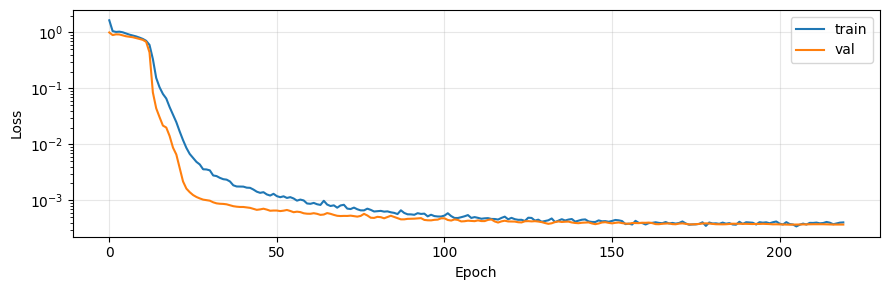

sungkyunkwan_university clusters: 7
C00: ['00', '19', '01', '18', '17']
C01: ['02']
C02: ['03']
C03: ['04', '14', '13', '12', '11', '10', '09', '08', '05']
C04: ['06', '07', '20']
C05: ['15', '16']
C06: ['21', '22']


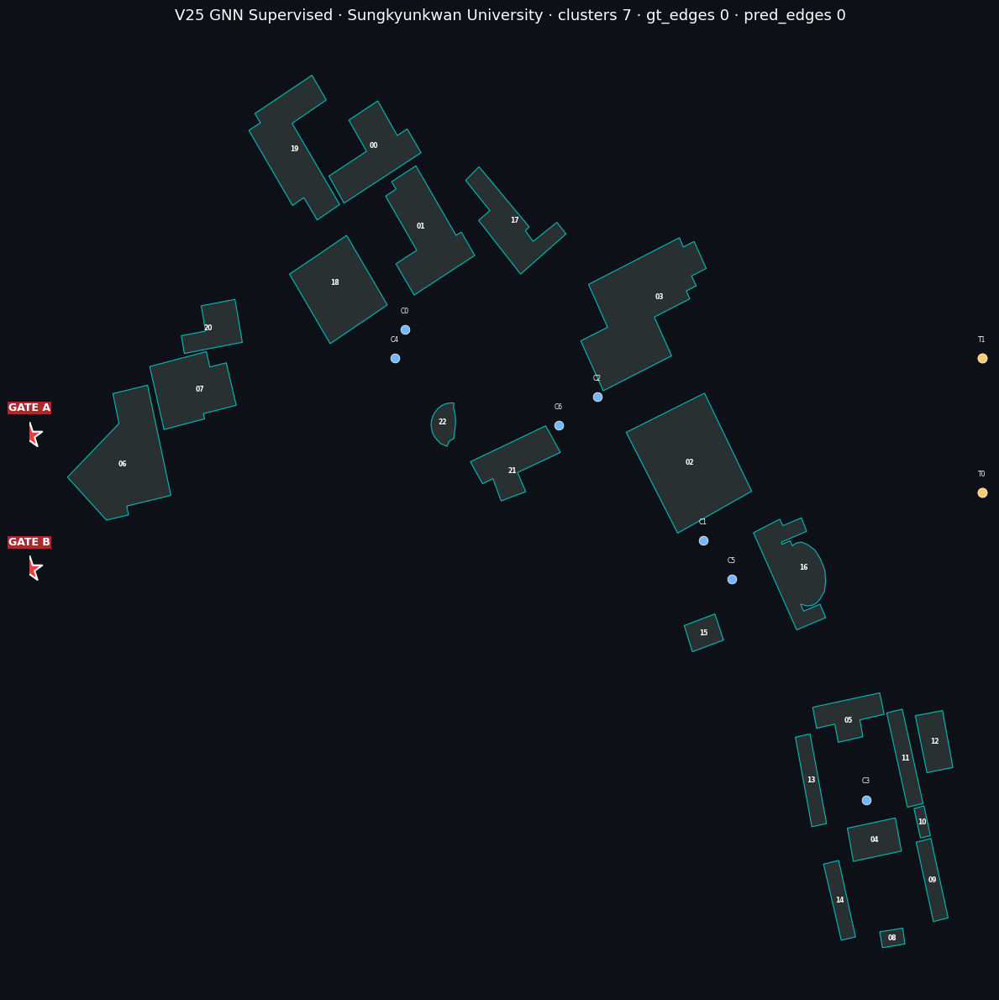


=== Test set (37개) GNN 예측 ===


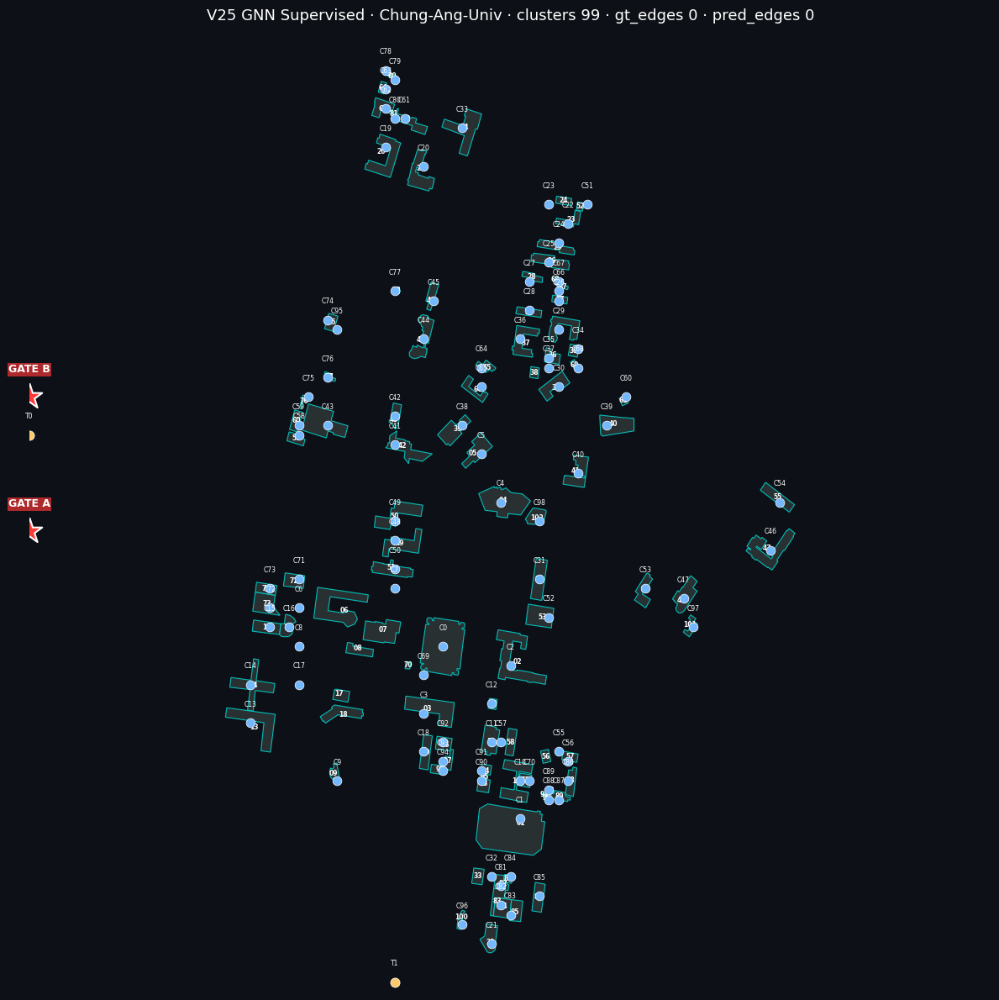

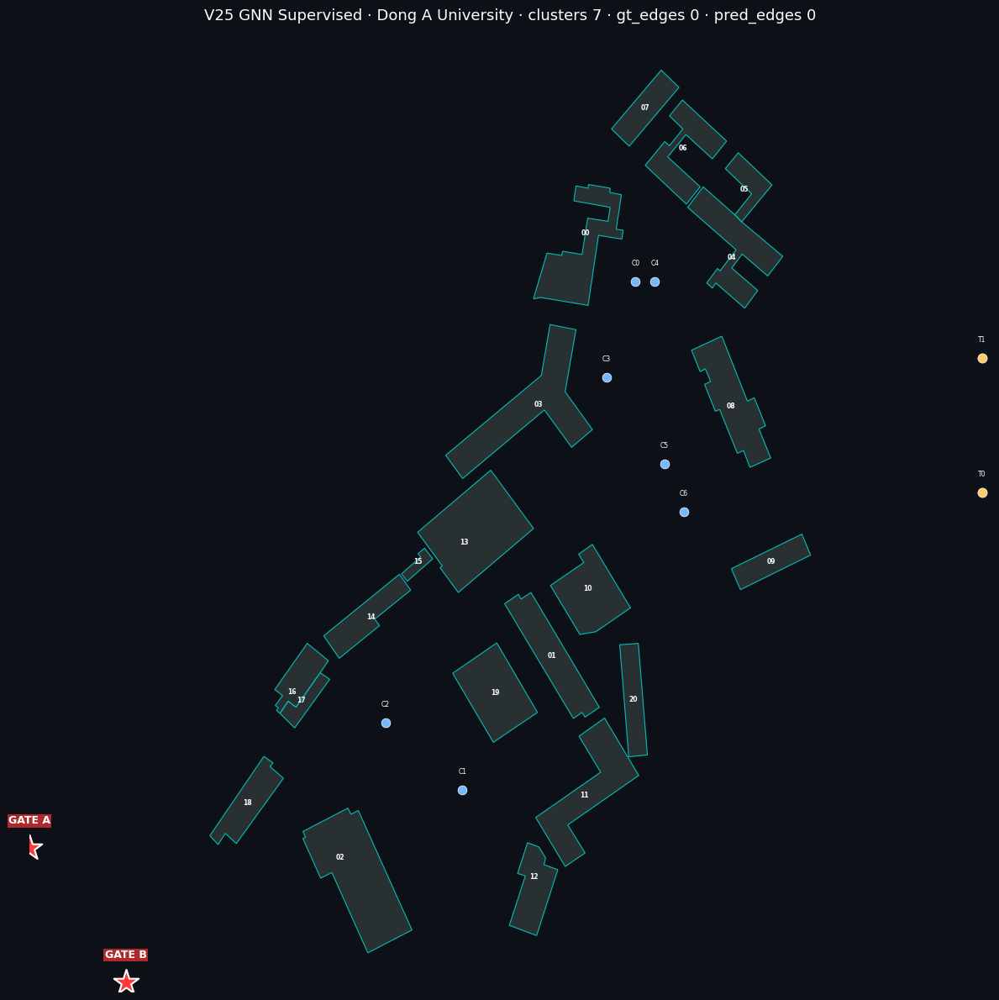

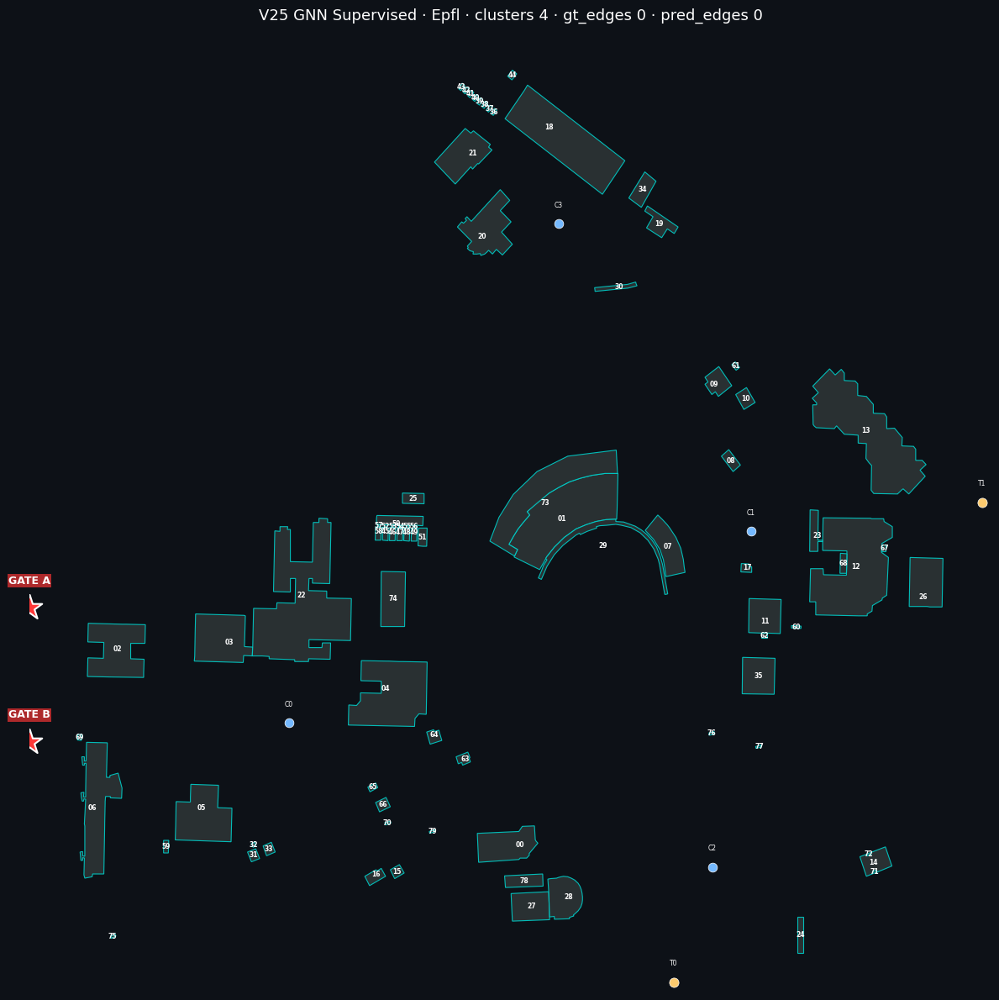

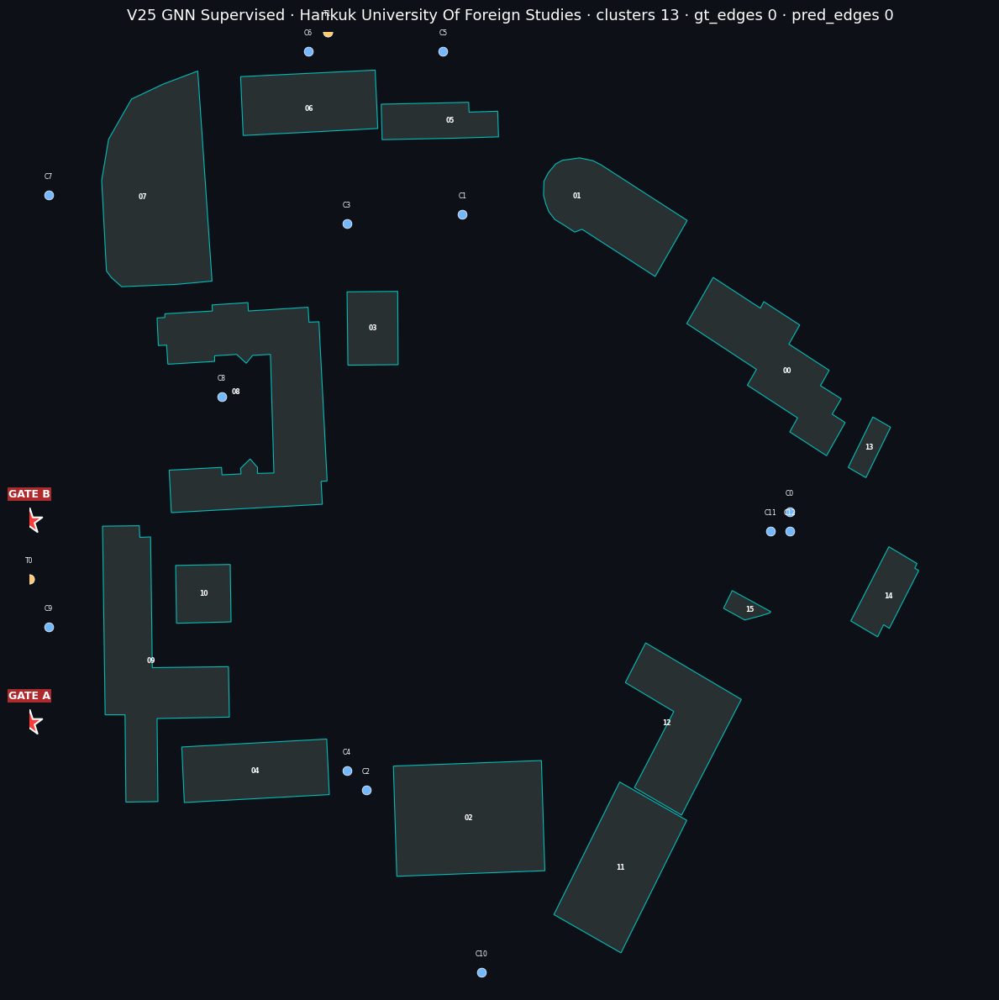

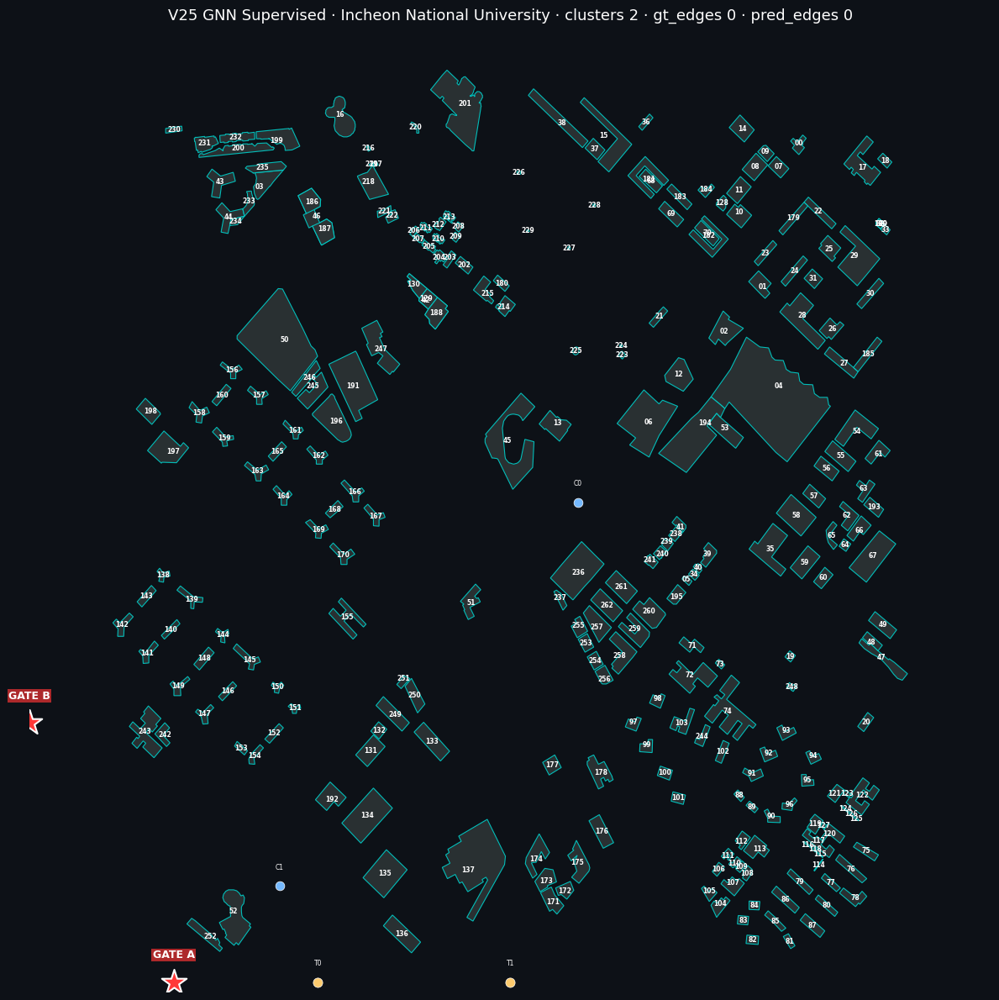

...

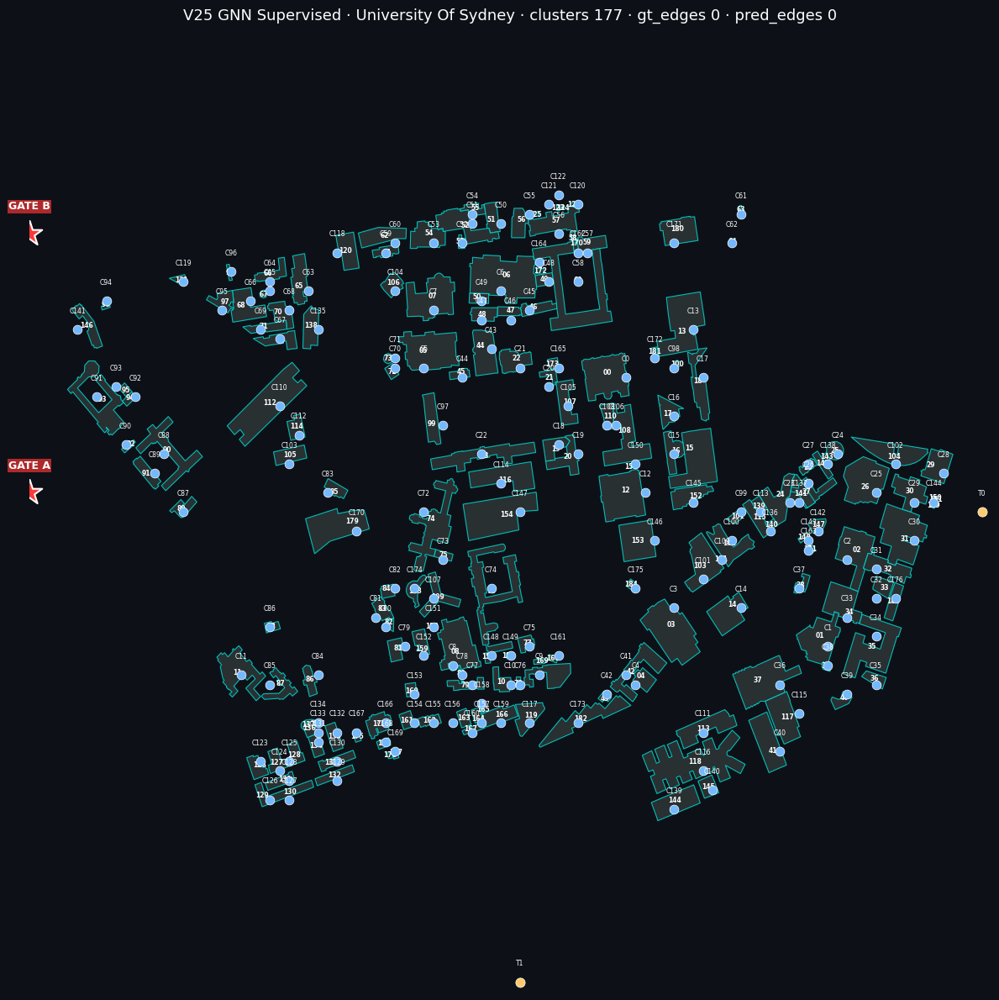

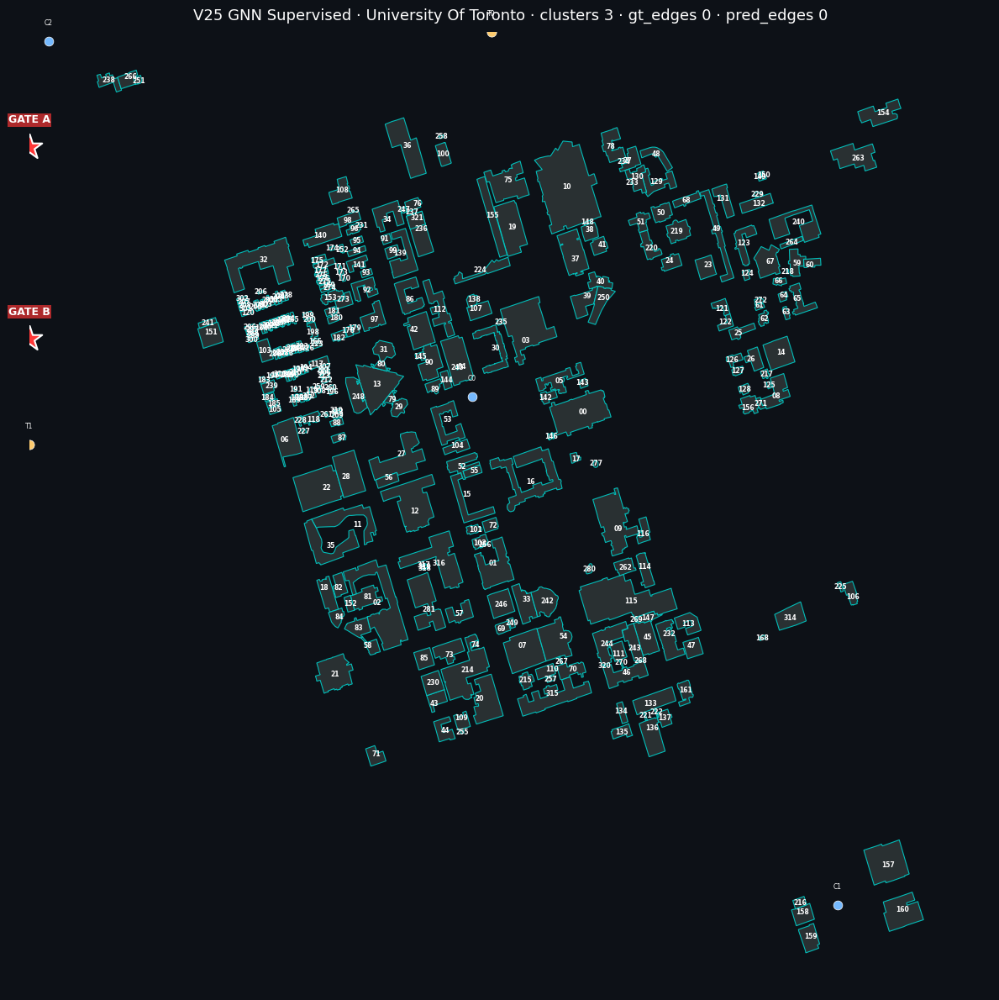

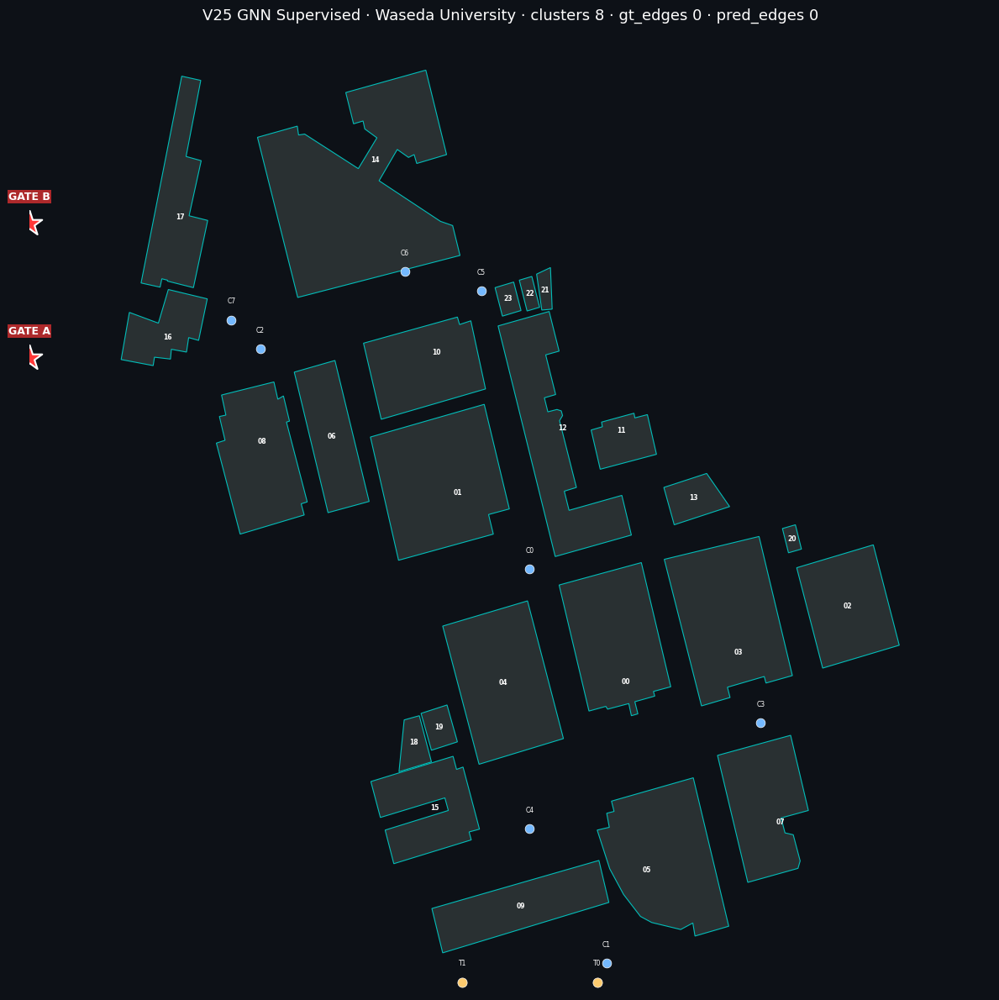

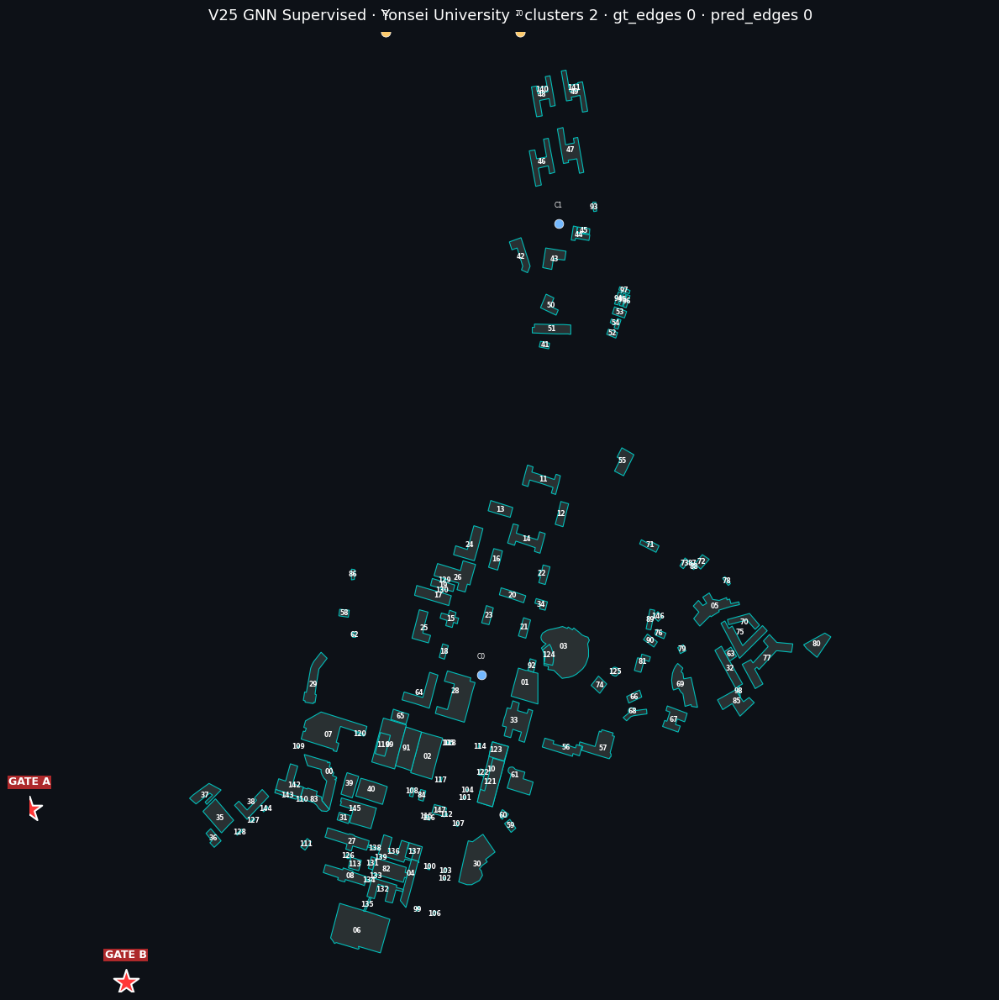

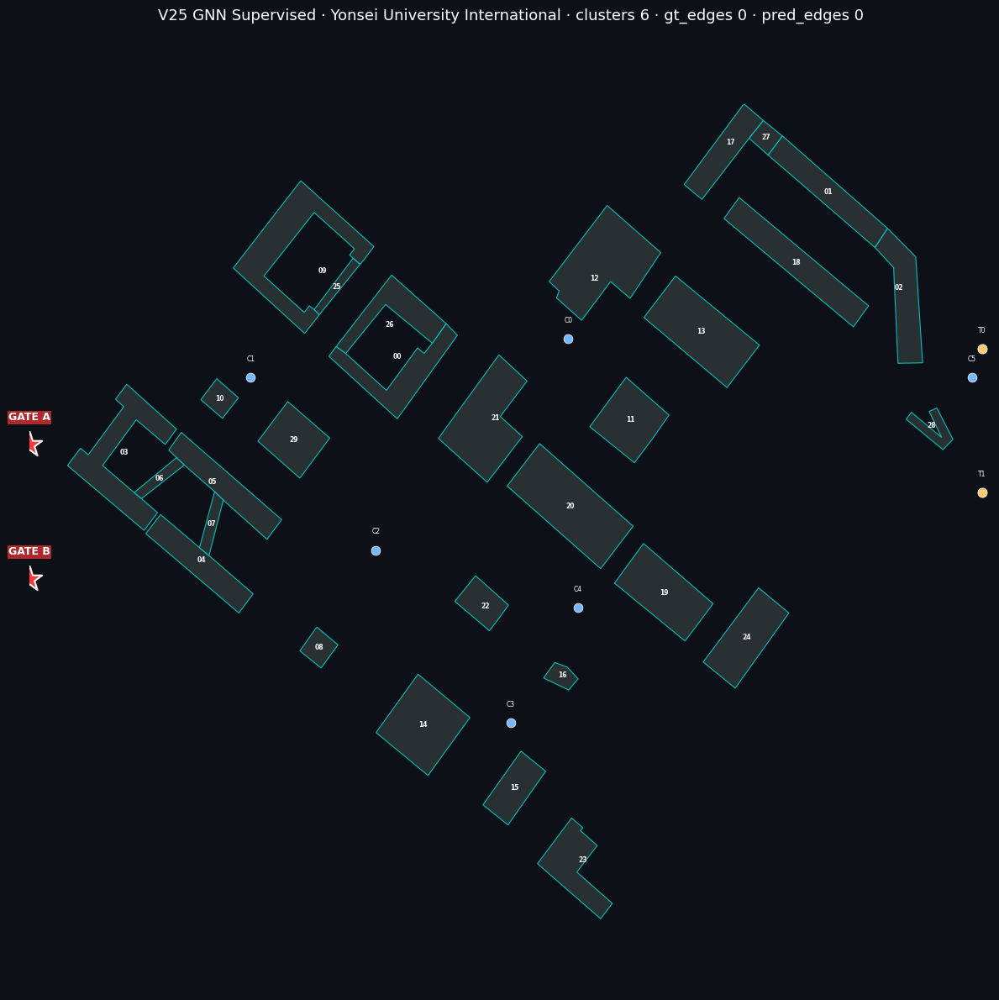


=== Test set (37개) ===


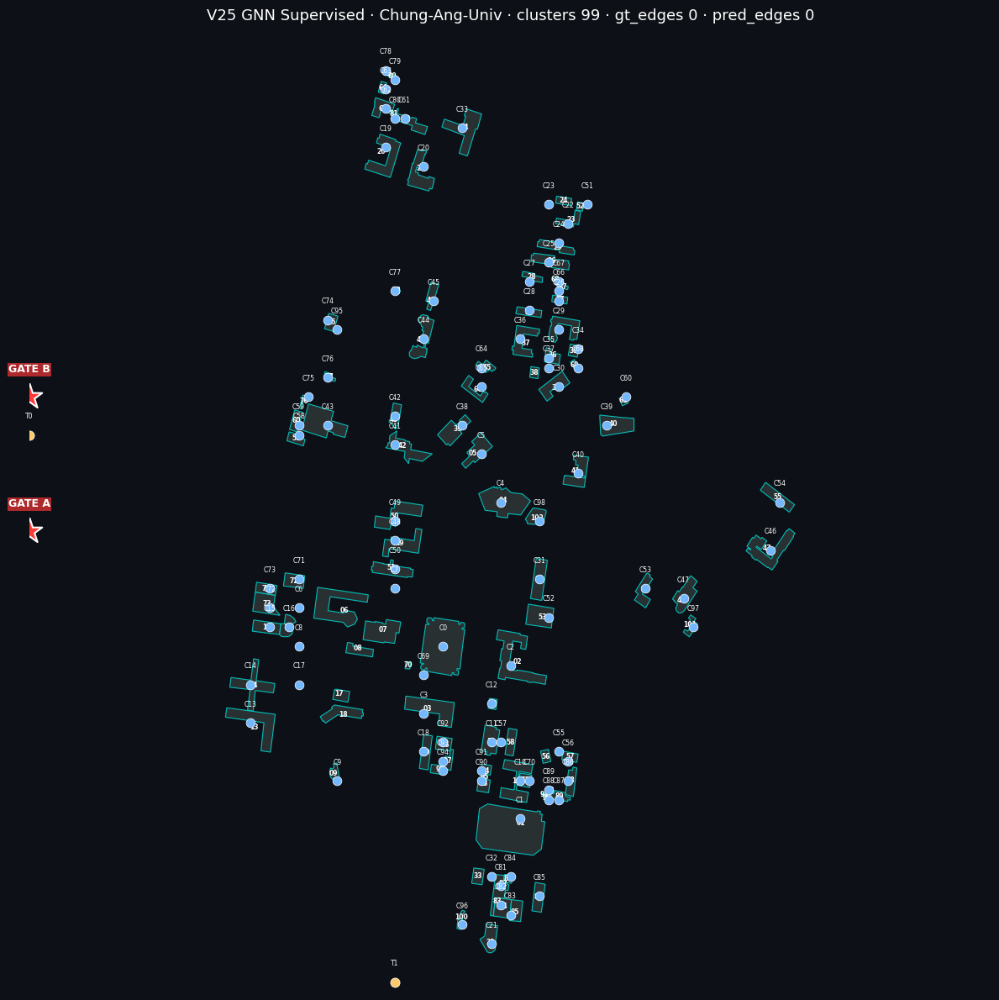

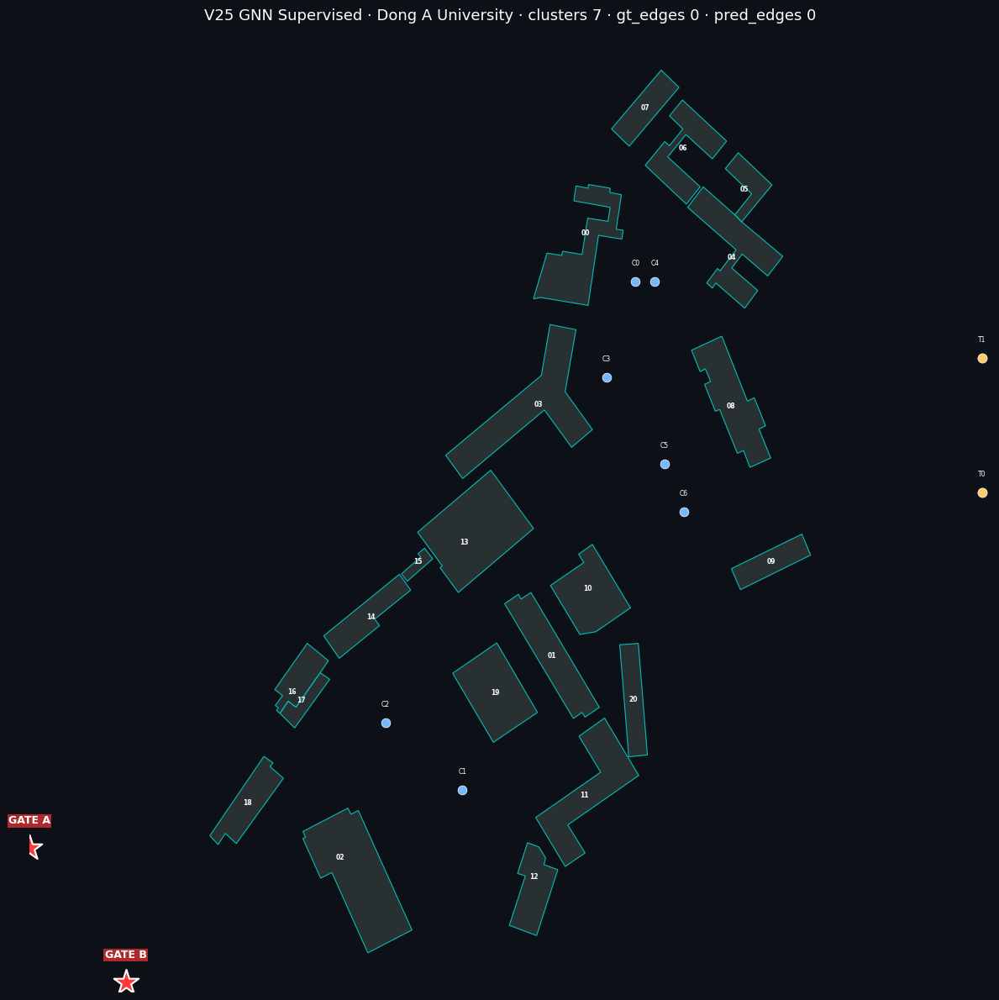

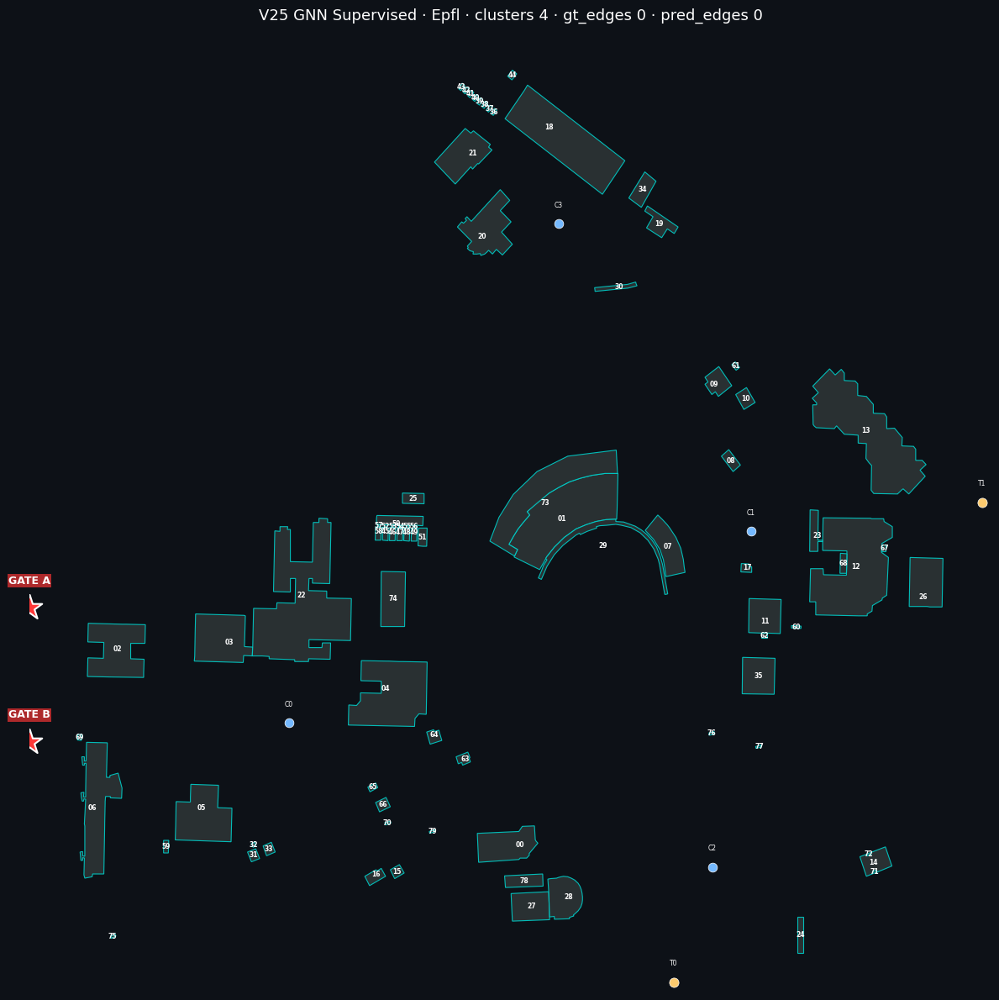

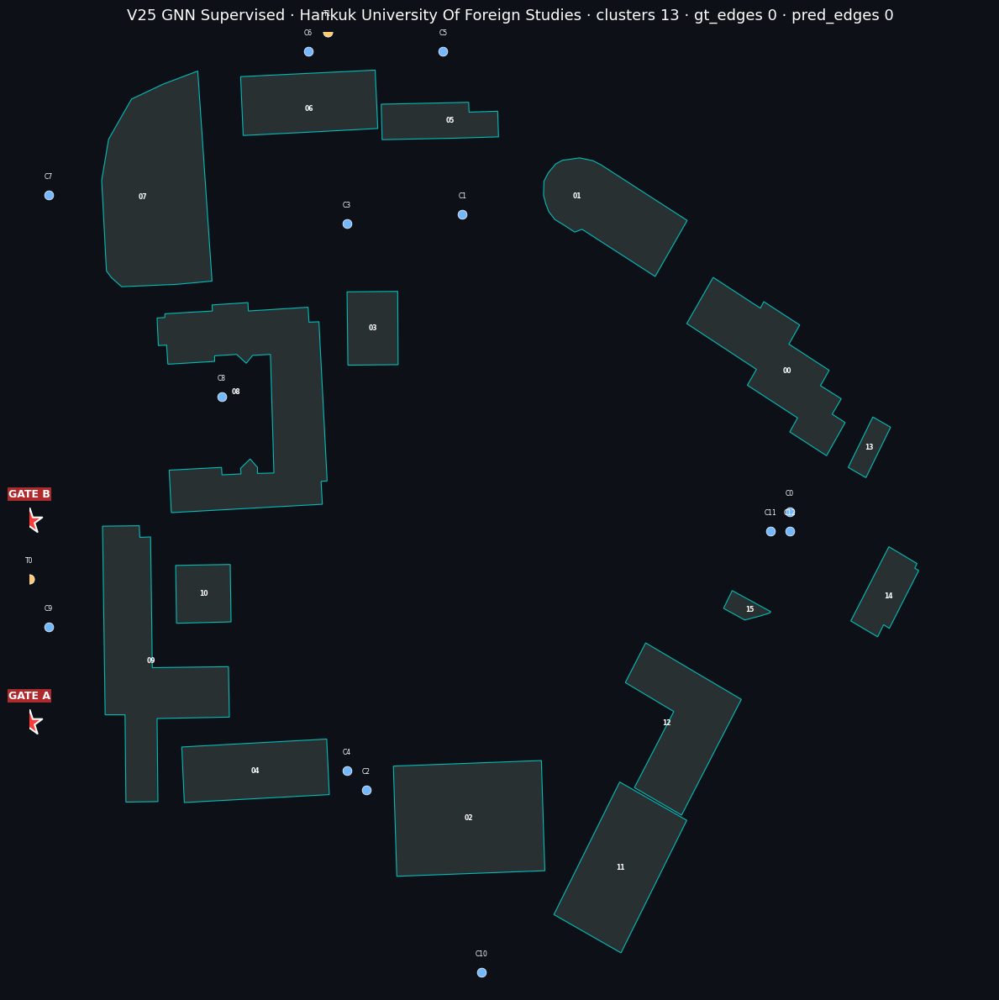

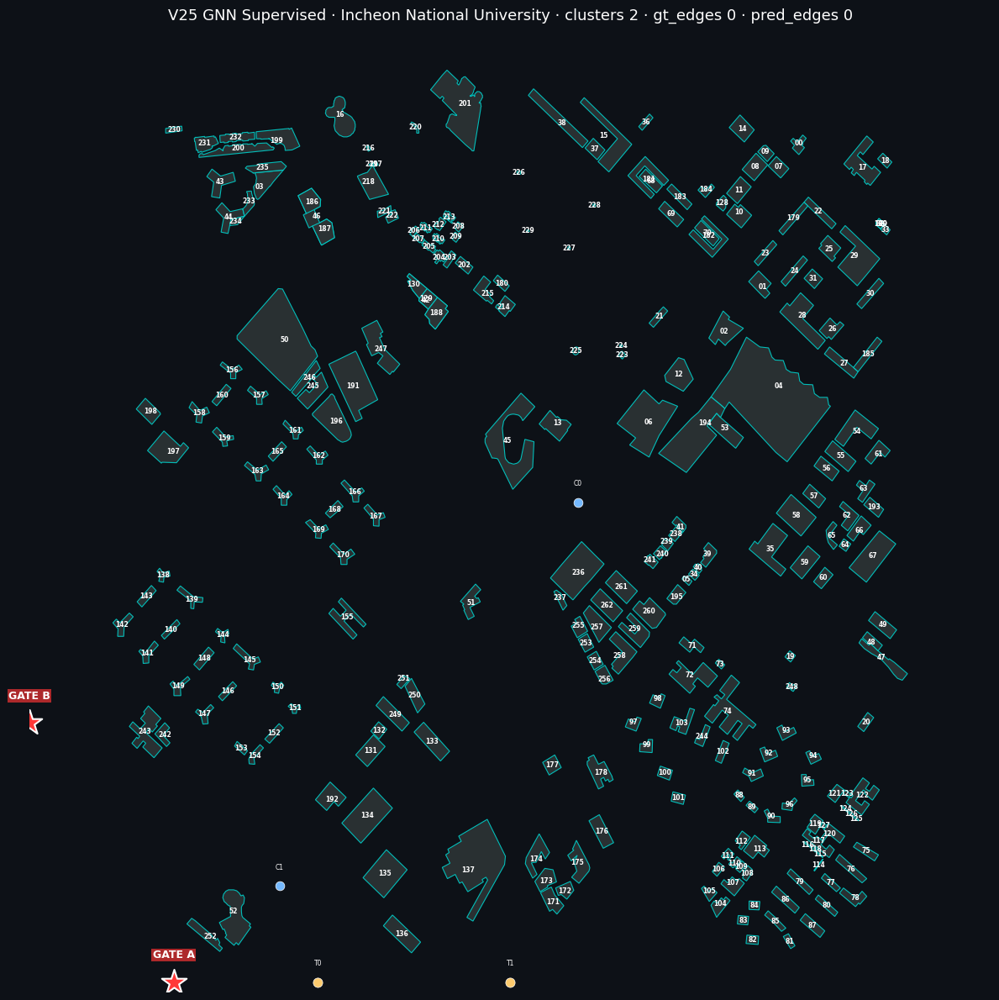

...

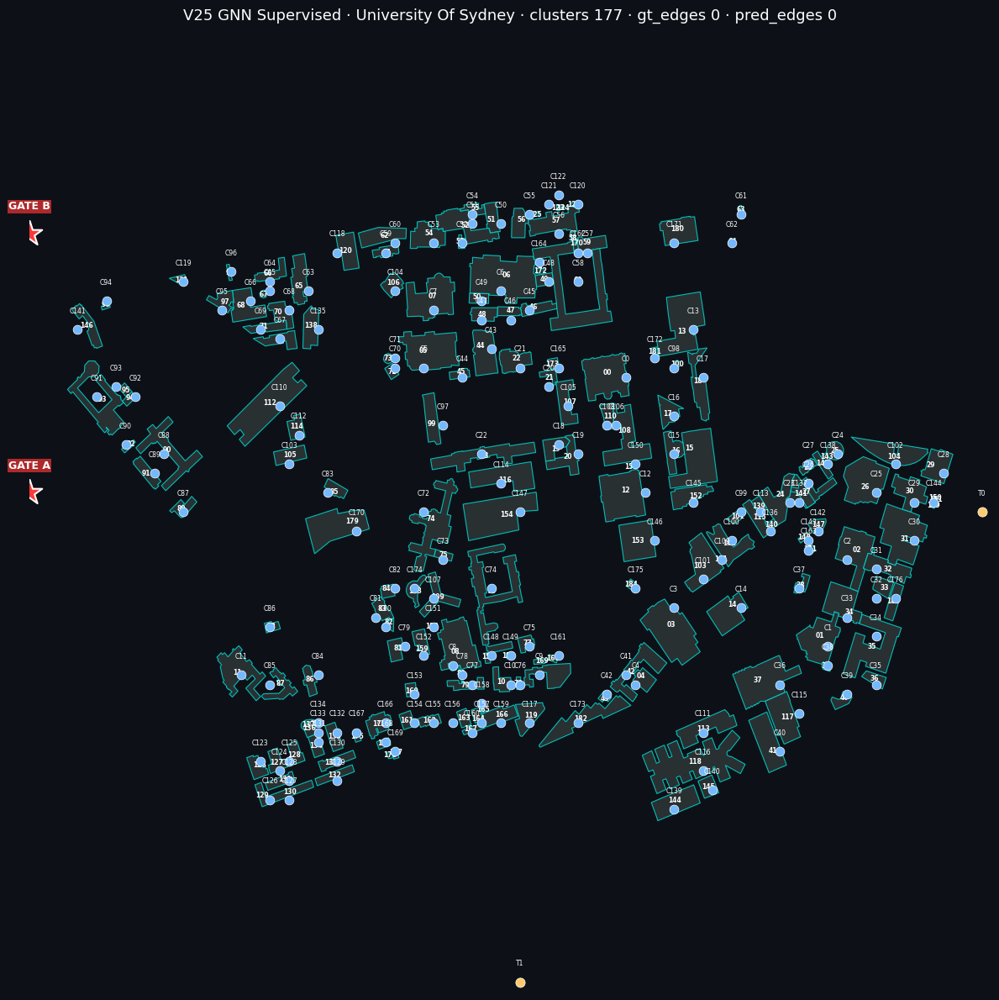

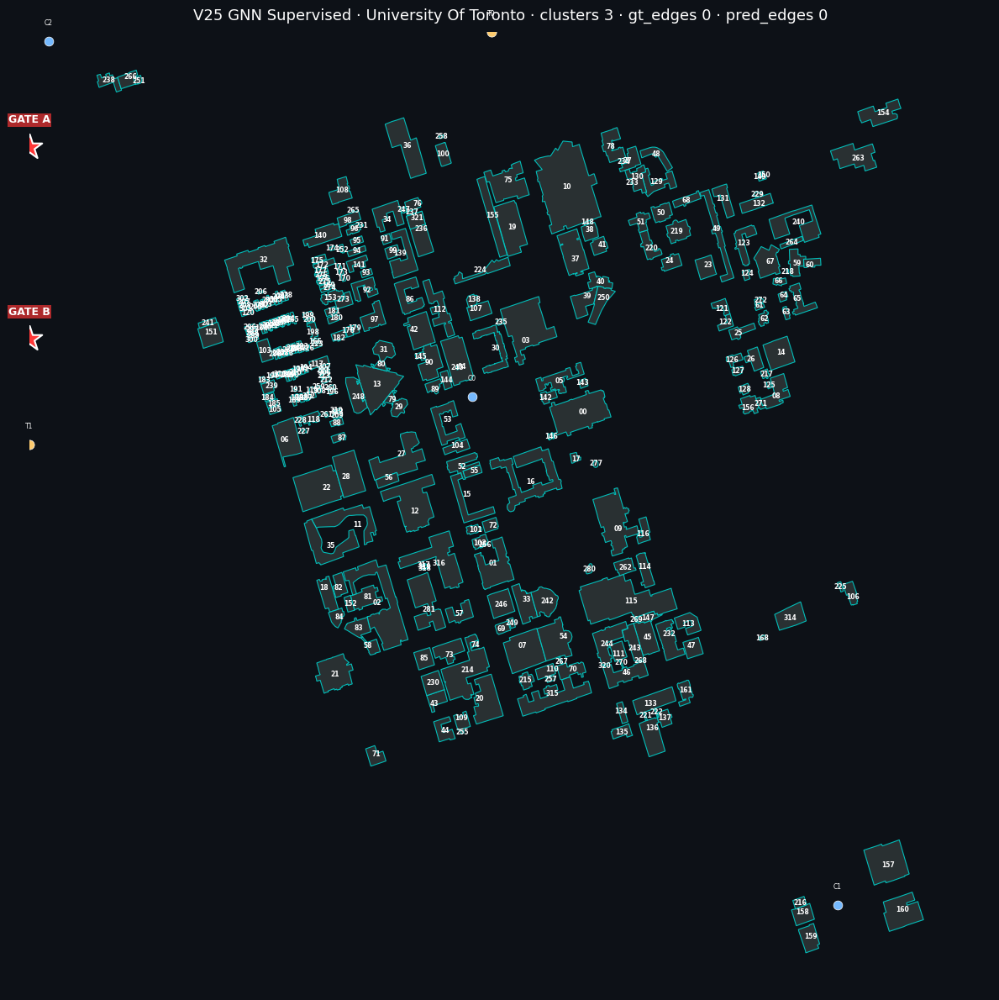

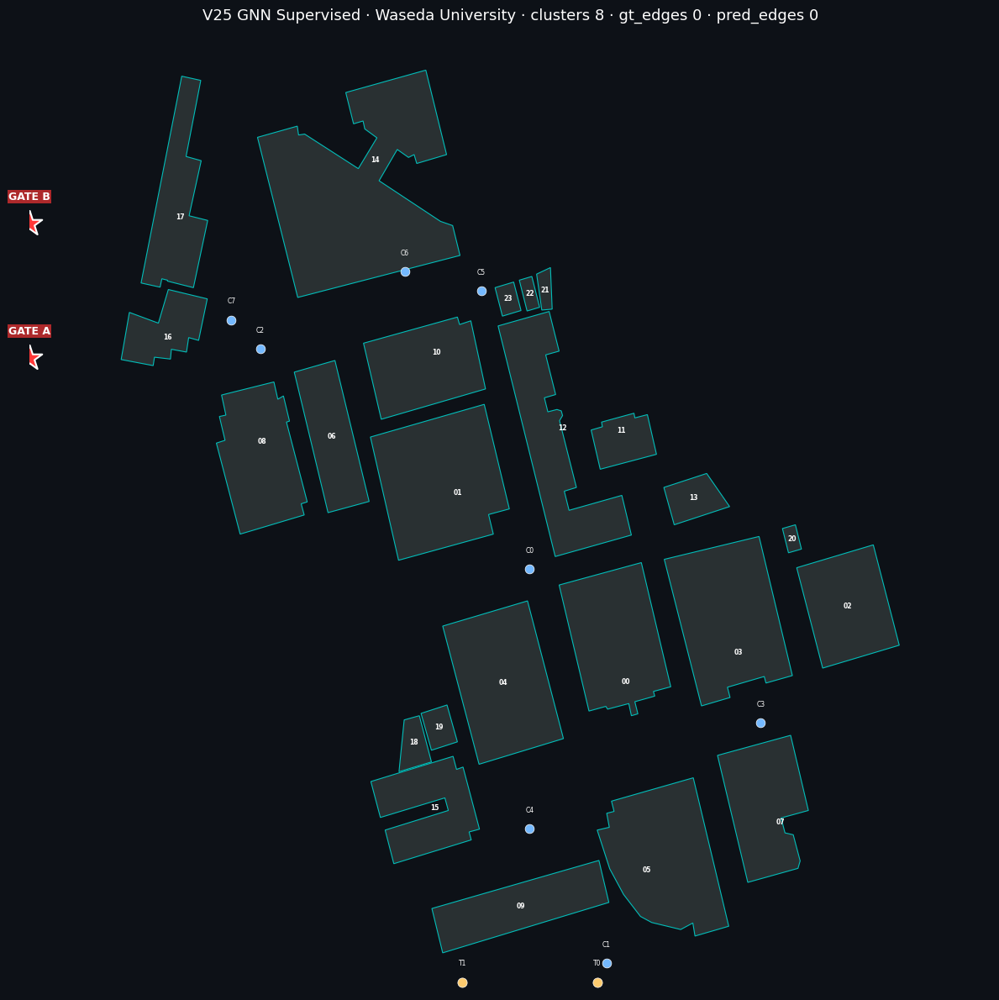

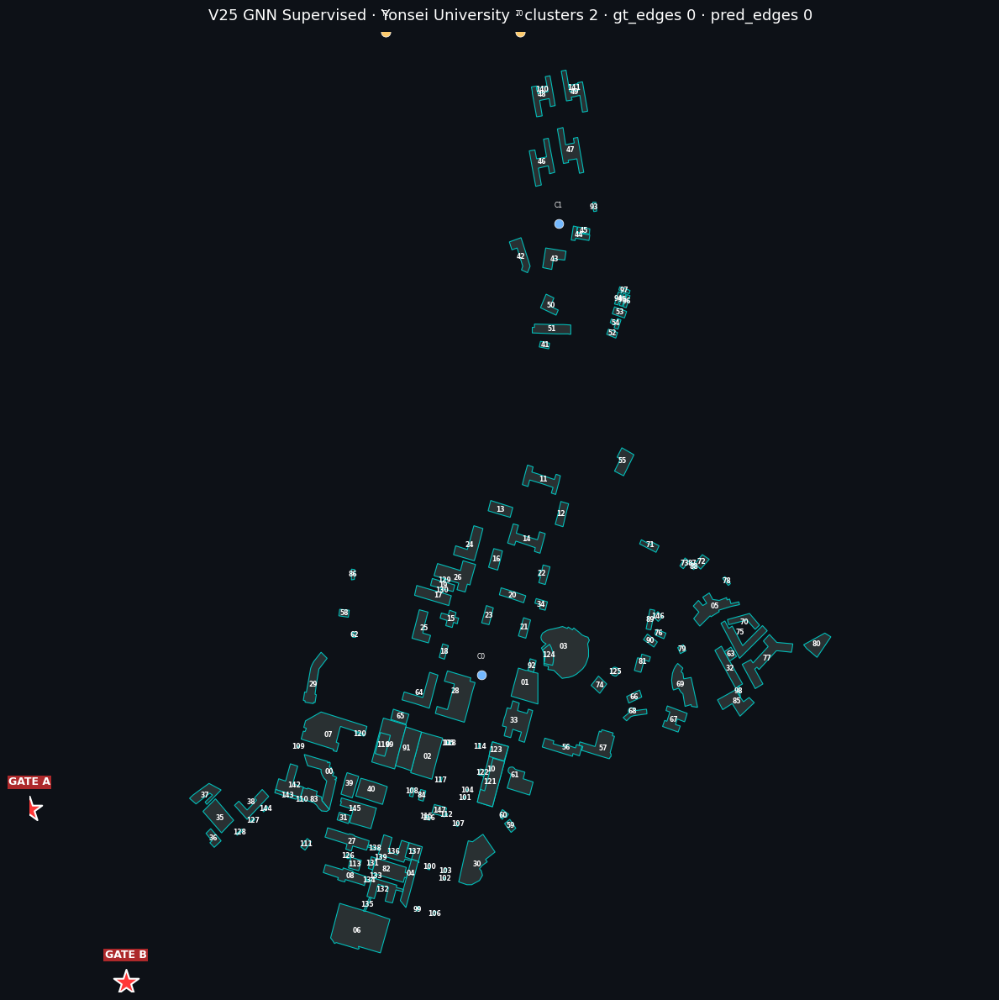

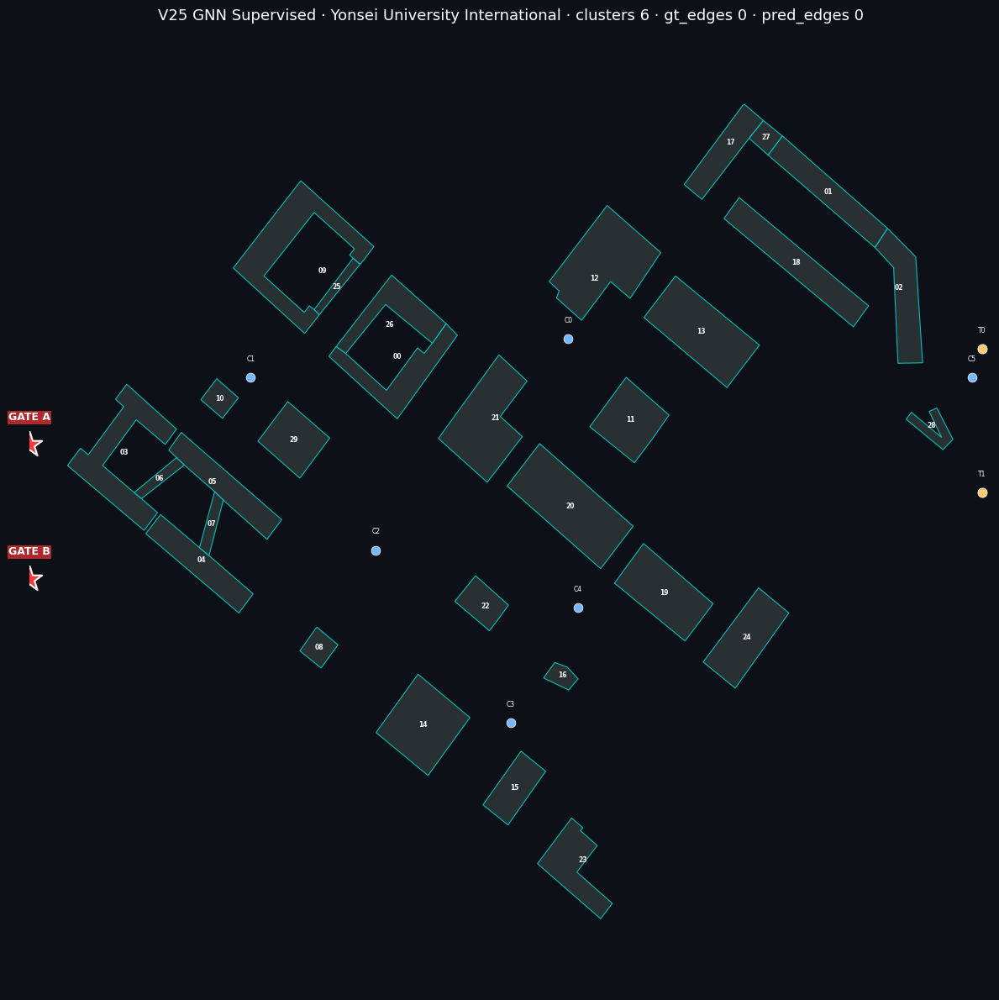

In [10]:
# ── 손실 커브 & 시각화 ─────────────────────────────────────────────────────────
# 학습이 중간에 끊긴 경우 여기서 체크포인트 로드
if os.path.exists(CKPT):
    ck = torch.load(CKPT, map_location=DEVICE)
    state = ck['model'] if isinstance(ck, dict) else ck
    model.load_state_dict(state)
    ep_loaded = ck.get('epoch', '?') if isinstance(ck, dict) else '?'
    print(f'체크포인트 로드: epoch={ep_loaded}')

if loss_curve:
    plt.figure(figsize=(9,3))
    plt.plot(loss_curve, label='train')
    if val_curve: plt.plot(val_curve, label='val')
    plt.yscale('log'); plt.xlabel('Epoch'); plt.ylabel('Loss')
    plt.legend(); plt.grid(alpha=0.3); plt.tight_layout(); plt.show()

def _draw_node(ax, node, color, label=None, size=55):
    y, x = divmod(int(node), RES)
    ax.scatter(x, y, s=size, c=color, edgecolors='white', linewidths=0.5, zorder=9)
    if label:
        ax.text(x, y-1.5, label, color='white', ha='center', va='bottom', fontsize=5.5, zorder=10)

def _prune_edges(selected, terminals, max_iter=PRUNE_ITERS):
    """GNN 출력 후처리. terminal에 닿지 않는 짧은 가지를 반복 제거합니다."""
    selected = selected.copy()
    ei = EDGE_INDEX.detach().cpu().numpy()
    src, dst = ei[0], ei[1]
    terminal_set = set(int(x) for x in terminals)
    for _ in range(max_iter):
        deg = np.zeros(N, dtype=np.int32)
        for i, keep in enumerate(selected):
            if not keep: continue
            s, d = int(src[i]), int(dst[i])
            if s == d: continue
            deg[s] += 1; deg[d] += 1
        remove = np.zeros_like(selected, dtype=bool)
        changed = False
        for i, keep in enumerate(selected):
            if not keep: continue
            s, d = int(src[i]), int(dst[i])
            if s == d: remove[i] = True; changed = True; continue
            if (deg[s] <= 1 and s not in terminal_set) or (deg[d] <= 1 and d not in terminal_set):
                remove[i] = True; changed = True
        selected[remove] = False
        if not changed: break
    return selected

def _largest_component_edges(selected):
    ei = EDGE_INDEX.detach().cpu().numpy()
    src, dst = ei[0], ei[1]
    adj = {}
    for i, keep in enumerate(selected):
        if not keep: continue
        s, d = int(src[i]), int(dst[i])
        if s == d: continue
        adj.setdefault(s, []).append(d)
        adj.setdefault(d, []).append(s)
    if not adj: return selected
    seen, comps = set(), []
    for node in adj:
        if node in seen: continue
        stack=[node]; seen.add(node); comp=[]
        while stack:
            u=stack.pop(); comp.append(u)
            for v in adj.get(u, []):
                if v not in seen:
                    seen.add(v); stack.append(v)
        comps.append(comp)
    keep_nodes = set(max(comps, key=len))
    out = selected.copy()
    for i, keep in enumerate(selected):
        if not keep: continue
        if int(src[i]) not in keep_nodes or int(dst[i]) not in keep_nodes:
            out[i] = False
    return out

def plot_campus(c, show_clusters=True, show_ridge=False, show_gt=True, use_prune=True):
    model.eval()
    with torch.no_grad():
        ew, edge_logits, gs = model(c['node_feats'], EDGE_INDEX, c['bld_mask'])
    ew_np=ew.cpu().numpy(); gs_np=gs.cpu().numpy(); ei=EDGE_INDEX.cpu(); ib_np=c['is_building'].cpu().numpy()
    W,H = c['W'],c['H']

    order=np.argsort(gs_np)[::-1]; chosen=[]
    for gi in order:
        gx=BOUNDARY[gi]%RES; gy=BOUNDARY[gi]//RES
        if all(abs(gx-BOUNDARY[p]%RES)+abs(gy-BOUNDARY[p]//RES)>=GATE_MIN_DIST for p in chosen):
            chosen.append(gi)
        if len(chosen)==N_GATES: break

    fig,ax=plt.subplots(figsize=(12,12)); ax.set_facecolor('#0d1117'); fig.patch.set_facecolor('#0d1117')

    if show_ridge:
        ridge_img = c['ridge'].detach().cpu().numpy().reshape(RES, RES)
        ax.imshow(ridge_img, cmap='gray', alpha=0.22, extent=[0, RES, RES, 0])

    for bid,pts in c['poly'].items():
        sc=[(p[0]*RES/W,p[1]*RES/H) for p in pts]
        ax.add_patch(mpatches.Polygon(sc,closed=True,facecolor='#2d3436',edgecolor='#00cec9',lw=0.8,alpha=0.9))
        ax.text(np.mean([p[0] for p in sc]),np.mean([p[1] for p in sc]),bid,color='white',ha='center',va='center',fontsize=5.5,fontweight='bold')

    # GT edge를 빨간 실선으로 표시
    if show_gt and c['gt_edge_mask'].sum() > 0:
        gt_edge_np = c['gt_edge_mask'].detach().cpu().numpy().astype(bool)
        for i, keep in enumerate(gt_edge_np):
            if not keep: continue
            s,d=ei[0,i].item(),ei[1,i].item()
            y1,x1=divmod(s,RES); y2,x2=divmod(d,RES)
            ax.plot([x1,x2],[y1,y2],color='#ff6b6b',alpha=0.28,lw=2.0,solid_capstyle='round',zorder=3)

    selected = ew_np > EDGE_THR
    if use_prune:
        selected = _largest_component_edges(selected)
        selected = _prune_edges(selected, c['terminal_nodes'].detach().cpu().numpy())
    selected_count = int(selected.sum())
    mxw=max(ew_np[selected].max() if selected.any() else EDGE_THR, EDGE_THR+1e-8)
    for i, keep in enumerate(selected):
        if not keep: continue
        w=ew_np[i]
        s,d=ei[0,i].item(),ei[1,i].item()
        if ib_np[s]>0 or ib_np[d]>0 or s == d: continue
        y1,x1=divmod(s,RES); y2,x2=divmod(d,RES)
        ax.plot([x1,x2],[y1,y2],color='#ffd32a',alpha=0.92,lw=max(1.2, (w-EDGE_THR)/(mxw-EDGE_THR+1e-8)*5+1),solid_capstyle='round',zorder=5)

    if show_clusters:
        for idx, node in enumerate(c['cluster_nodes'].detach().cpu().numpy()):
            _draw_node(ax, node, '#74b9ff', label=f'C{idx}', size=60)
        for idx, node in enumerate(c['gate_nodes'].detach().cpu().numpy()):
            _draw_node(ax, node, '#fdcb6e', label=f'T{idx}', size=65)

    for k,gi in enumerate(chosen):
        node=BOUNDARY[gi]; gx,gy=node%RES,node//RES
        ax.scatter(gx,gy,s=500,c='#ff3838',marker='*',edgecolors='white',lw=1.5,zorder=10)
        ax.text(gx,gy-2.5,f'GATE {chr(65+k)}',color='white',ha='center',fontsize=9,fontweight='bold',bbox=dict(fc='#d63031',alpha=0.8,ec='none',pad=1))

    ax.set_xlim(0,RES); ax.set_ylim(RES,0); ax.axis('off')
    n_gt = int(c['gt_nodes_mask'].sum())
    n_ge = int(c['gt_edge_mask'].sum())
    ax.set_title(
        f'V25 GNN Supervised · {c["name"].replace("_"," ").title()} · '
        f'clusters {len(c["cluster_nodes"])} · gt_edges {n_ge} · pred_edges {selected_count}',
        color='white', fontsize=13, pad=10
    )
    plt.tight_layout()
    plt.savefig(os.path.join(OUT_DIR,f'v25_gnn_supervised_{c["name"]}.png'),dpi=150,bbox_inches='tight',facecolor='#0d1117')
    plt.show(); plt.close()

def print_clusters(c):
    print(f"{c['name']} clusters: {len(c['cluster_groups'])}")
    for i, group in enumerate(c['cluster_groups']):
        print(f"C{i:02d}: {group}")

TARGET = 'sungkyunkwan_university'
target = next((c for c in campuses if TARGET in c['name']), None)
if target:
    print_clusters(target)
    plot_campus(target, show_clusters=True, show_ridge=False, show_gt=True, use_prune=True)

# ── Test set 전체: GNN 예측 결과만 시각화 (GT 없음) ─────────────────────
print(f'\n=== Test set ({len(test_campuses)}개) GNN 예측 ===')
for tc in test_campuses:
    plot_campus(tc, show_clusters=True, show_ridge=False, show_gt=False, use_prune=True)

# ── Test set 전체 시각화 ──────────────────────────────────────────────────
print(f'\n=== Test set ({len(test_campuses)}개) ===')
for tc in test_campuses:
    plot_campus(tc, show_clusters=True, show_ridge=False, show_gt=True, use_prune=True)
